k-nearest neighbours is a technique that uses a notion of distance and the assumption of similarity for small distance to make-predictions. This probably tends to over homogenise predictions "geographically".

It's interesting to pay attention to how much of a dataset that a model uses in order to make a prediction. K-nearest neighbours clearly only uses a very small part of the data to make a prediction, and so ignores a lot of potentially useful information. K-nearest neighbours aso does not give very good intuition as to why things are the way they are.

In [1]:
from collections import Counter
from alldsfsfuncs import distance

def raw_majority_vote(labels):
    votes = Counter(labels)
    winner,_ = votes.most_common(1)[0]
    return winner

X = ["b","a","b","b","a","a","c","c"]
print raw_majority_vote(X)

def majority_vote(labels):
    """assumes the labels are ordered from nearest to farthest"""
    votes = Counter(labels)
    winner, winner_count = votes.most_common(1)[0]
    num_winners = len([count for count in votes.values() if count == winner_count])
    if num_winners == 1:
        return winner
    else:
        return majority_vote(labels[:-1])
        
print majority_vote(X)

def knn_classify(k, labelled_pts, new_pt):
    """each labelled point should be a pair (point, label)"""
    
    #order the labelled points by distance from the new point
    by_distance = sorted(labelled_pts, key= lambda (pt, label): distance(pt, new_pt))
    
    #get labels for k closest
    k_nearest_labels = [label for _, label in by_distance[:k]]
    
    #let them vote
    return majority_vote(k_nearest_labels)
    
cities = [(-86.75,33.5666666666667,'Python'),(-88.25,30.6833333333333,'Python'),(-112.016666666667,33.4333333333333,'Java'),(-110.933333333333,32.1166666666667,'Java'),(-92.2333333333333,34.7333333333333,'R'),(-121.95,37.7,'R'),(-118.15,33.8166666666667,'Python'),(-118.233333333333,34.05,'Java'),(-122.316666666667,37.8166666666667,'R'),(-117.6,34.05,'Python'),(-116.533333333333,33.8166666666667,'Python'),(-121.5,38.5166666666667,'R'),(-117.166666666667,32.7333333333333,'R'),(-122.383333333333,37.6166666666667,'R'),(-121.933333333333,37.3666666666667,'R'),(-122.016666666667,36.9833333333333,'Python'),(-104.716666666667,38.8166666666667,'Python'),(-104.866666666667,39.75,'Python'),(-72.65,41.7333333333333,'R'),(-75.6,39.6666666666667,'Python'),(-77.0333333333333,38.85,'Python'),(-80.2666666666667,25.8,'Java'),(-81.3833333333333,28.55,'Java'),(-82.5333333333333,27.9666666666667,'Java'),(-84.4333333333333,33.65,'Python'),(-116.216666666667,43.5666666666667,'Python'),(-87.75,41.7833333333333,'Java'),(-86.2833333333333,39.7333333333333,'Java'),(-93.65,41.5333333333333,'Java'),(-97.4166666666667,37.65,'Java'),(-85.7333333333333,38.1833333333333,'Python'),(-90.25,29.9833333333333,'Java'),(-70.3166666666667,43.65,'R'),(-76.6666666666667,39.1833333333333,'R'),(-71.0333333333333,42.3666666666667,'R'),(-72.5333333333333,42.2,'R'),(-83.0166666666667,42.4166666666667,'Python'),(-84.6,42.7833333333333,'Python'),(-93.2166666666667,44.8833333333333,'Python'),(-90.0833333333333,32.3166666666667,'Java'),(-94.5833333333333,39.1166666666667,'Java'),(-90.3833333333333,38.75,'Python'),(-108.533333333333,45.8,'Python'),(-95.9,41.3,'Python'),(-115.166666666667,36.0833333333333,'Java'),(-71.4333333333333,42.9333333333333,'R'),(-74.1666666666667,40.7,'R'),(-106.616666666667,35.05,'Python'),(-78.7333333333333,42.9333333333333,'R'),(-73.9666666666667,40.7833333333333,'R'),(-80.9333333333333,35.2166666666667,'Python'),(-78.7833333333333,35.8666666666667,'Python'),(-100.75,46.7666666666667,'Java'),(-84.5166666666667,39.15,'Java'),(-81.85,41.4,'Java'),(-82.8833333333333,40,'Java'),(-97.6,35.4,'Python'),(-122.666666666667,45.5333333333333,'Python'),(-75.25,39.8833333333333,'Python'),(-80.2166666666667,40.5,'Python'),(-71.4333333333333,41.7333333333333,'R'),(-81.1166666666667,33.95,'R'),(-96.7333333333333,43.5666666666667,'Python'),(-90,35.05,'R'),(-86.6833333333333,36.1166666666667,'R'),(-97.7,30.3,'Python'),(-96.85,32.85,'Java'),(-95.35,29.9666666666667,'Java'),(-98.4666666666667,29.5333333333333,'Java'),(-111.966666666667,40.7666666666667,'Python'),(-73.15,44.4666666666667,'R'),(-77.3333333333333,37.5,'Python'),(-122.3,47.5333333333333,'Python'),(-89.3333333333333,43.1333333333333,'R'),(-104.816666666667,41.15,'Java')]
cities = [([longitude, latitude], language) for longitude, latitude, language in cities]



a
b


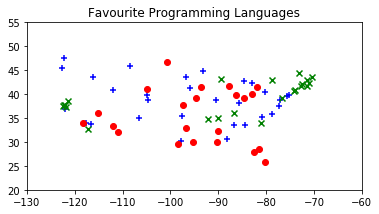

In [2]:
from matplotlib import pyplot as plt

coords_by_lang = {'Python': ([],[]), 'R': ([],[]), 'Java':([], [])}

for (longitude, latitude), lang in cities:
    coords_by_lang[lang][0].append(longitude)
    coords_by_lang[lang][1].append(latitude)
    
colours = {"Java":"r", "Python":"b", "R":"g"}
markers = {"Java":"o", "Python":"+", "R":"x"}

fig, axs = plt.subplots(1)

for lang, (x,y) in coords_by_lang.iteritems():
    axs.scatter(x,y,color = colours[lang], marker=markers[lang], label=lang, zorder=10)

# ax1.legend(loc=0)
axs.axis([-130,-60,20,55])
axs.set_aspect("equal")


plt.title("Favourite Programming Languages")
plt.show()

In [3]:
for k in [1, 3, 5, 7]:
    num_correct = 0 
    
    for city in cities:
        location, actual_language = city
        other_cities = [other_city for other_city in cities if other_city != city]
        
        predicted_language = knn_classify(k, other_cities, location)
        if predicted_language == actual_language:
            num_correct += 1
    print k, " neighbour[s]:", num_correct, " out of", len(cities)

1  neighbour[s]: 40  out of 75
3  neighbour[s]: 44  out of 75
5  neighbour[s]: 41  out of 75
7  neighbour[s]: 35  out of 75


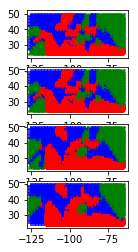

In [4]:


fig, axs = plt.subplots(4)

ax1,ax2,ax3,ax4 = axs

for k in range(4):
    for x in range(-125,-65):
        for y in range(25,50):
            predicted_language = knn_classify(k+1, cities, [x,y])
            axs[k].scatter(x,y,
                           color = colours[predicted_language], 
                           marker=markers[predicted_language], 
                           label=predicted_language, 
                           zorder=10)
            axs[k].set_aspect("equal")
            
plt.show()

In [5]:
import re
import math
from collections import defaultdict

def tokenize(message):
    message = message.lower()
    all_words = re.findall("[a-z0-9']+", message)
    return set(all_words)
print tokenize("Hello, hello this is a sentence with some words repeated in the sentence, don't forget to brush your teeth")

set(['a', 'forget', 'sentence', 'this', 'is', "don't", 'some', 'your', 'teeth', 'to', 'repeated', 'brush', 'words', 'in', 'the', 'with', 'hello'])


Tokenize takes strings and breaks them into a list of words, made lower case and stripped of whitespace and  punctuation other than $'$.

In [6]:
def count_words(training_set):
    """training set consists of pairs (message, is_spam)"""
    counts = defaultdict(lambda: [0,0])
    for message, is_spam in training_set:
        for word in tokenize(message):
            counts[word][0 if is_spam else 1] += 1
    return counts    

Given that a word occurs in an email, I want to estimate the probability that that email is spam $P(S\mid w)$. I'll use Bayes rule: $P(S\mid w) = \frac{P(w\mid S)}{P(w\mid S)+P(w\mid \sim S)}$. I'll then need estimates for $P(w \mid S)$ and $P(w \mid \sim S)$. A good start can be had by getting a double tally of the number of times a word is seen in spam email headers vs non spam emails  $(m,n)$ from $h,l$ spam and non-spam training emails. We could then estimate $P(w \mid S) \approx \frac{m}{h}$ and $P(w \mid \sim S) \approx \frac{n}{l}$.

In [46]:
def word_probabilities(counts, total_spams, total_non_spams, k=0.5):
    """turn the word into a list of triplets, w, p(w|spam), p(w|~spam)"""
    return [(w,
            (spam + k) / (total_spams + 2*k),
            (non_spam + k) / (total_non_spams + 2*k))
           for w, (spam, non_spam) in counts.iteritems()]

There is a problem if a word is only ever observed in one of the two classes of email. Say $w$ is only seen in nonspam emails among our training set, then $P(w \mid S) = 0$. This is obviously much too certain an estimate and will cause us problems later. We can adjust our counts using a $\textit{pseudocount}$, so that our new estimates are $P(w \mid S) \approx \frac{m + k}{h+2k}$ and $P(w \mid \sim S) \approx \frac{n+k}{l+2k}$ where $k$ is chosen to reflect a reasonable estimate for an absent word. Note that in the absense of any data this pseudocount estimates the class probabilities at $0.5$, which seems like a reasonable prior if you know nothing. The next charts look at the behaviour of the psuedocount for a few values of  $k$.

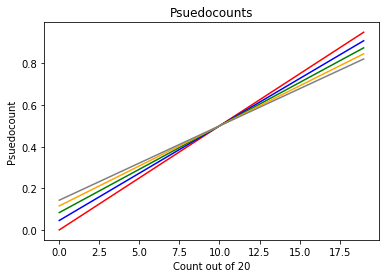

In [76]:
from __future__ import division
_, ax = plt.subplots()

total = 20
ks = np.arange(0,5,1)
cols = ["red","blue","green","orange","grey"]

for k,col in zip(ks,cols):
    xs = range(total)
    ys = [(x + k)/(total + 2*k) for x in xs]
    ax.plot(xs,ys, color=col)
    
ax.set(xlabel ="Count out of {}".format(total), ylabel = "Psuedocount", title="Psuedocounts" )
plt.show()


The Pseudocount effectively establishes an upper and lower bound on the probability assigned to a word occuring in any given spam or non spam email. This is to account for the possibility that a word has never been seen in one or both of the categories.

In [8]:
def spam_probability(word_probs,message):
    message_words = tokenize(message)
    log_prob_if_spam = log_prob_if_not_spam = 0.0
    
    #iterate through each word in our vocabulary
    for word, prob_if_spam, prob_if_not_spam in word_probs:
        
        #if *word* appears in the message,
        #add the log probability of seeing it
        if word in message_words:
            log_prob_if_spam += math.log(prob_if_spam)
            log_prob_if_not_spam += math.log(prob_if_not_spam)
            
        #if *word* doesn't appear in the message
        #add the log probability of _not_ seeing it 
        #which is log(1 - probability of seeing it)
        else:
            log_prob_if_spam += math.log(1.0 - prob_if_spam)
            log_prob_if_not_spam += math.log(1.0 - prob_if_not_spam)
            
    prob_if_spam = math.exp(log_prob_if_spam)
    prob_if_not_spam = math.exp(log_prob_if_not_spam)
    return prob_if_spam / (prob_if_spam + prob_if_not_spam) #bayes

Here's how we use Bayes and the assumpiton of independence to get an estimate for the probability that $S$ is spam. For an email of just one word:
\begin{equation}
P(S \mid X_i) = \frac{P(X_i \mid S)}{P(X_i \mid S) + P(X_i \mid \sim S)}
\end{equation}
where $S$ is the event that an email is spam, $X_i = w_i$ is the event that the word $w_i$ occurs in the email.
For many words:
\begin{equation}
P(S \mid X_1, \dots, X_d) = \frac{P(X_1, \dots, X_d \mid S)}{P(X_1, \dots, X_d \mid S) + P(X_1, \dots, X_d \mid \sim S)}
\end{equation}
If we assume that all the occurrences of a word in an email are independent (that is, the occurrence of "cheap" tells us nothing about the occurrence of "viagra" and viceversa): 
\begin{equation}
P( X_1,\dots,X_d \mid S) = \prod_i^d P( X_i \mid S)
\end{equation}

and so 
\begin{equation}
P(S \mid X_1, \dots, X_d) = \prod_i^d \frac{P(X_i\mid S)}{P(X_i \mid S) + P(X_i \mid \sim S)}
\end{equation}

When we actually implement this we must be careful not to multipy too many small numbers together, or we might get $underflow$.


In [9]:
class NaiveBayesClassifier:
    
    def __init__(self, k=0.5):  #every classifier is born with a constant k and an empty word prob list
        self.k = k
        self.word_probs = []
        
    def train(self, training_set):
        
        #count spam and non-spam messages
        num_spams = len([is_spam
                        for message, is_spam in training_set
                        if is_spam])
        num_non_spams = len(training_set) - num_spams
        
        #run training data through our "pipeline"
        word_counts = count_words(training_set)
        self.word_probs = word_probabilities(word_counts,
                                            num_spams,
                                            num_non_spams,
                                            self.k)
        
    def classify(self, message):
        return spam_probability(self.word_probs, message)

The practice emails are stored in a tar ball, which is some kind of weird format.

In [119]:
import glob, re

easy_ham_fn = "20021010_easy_ham"
hard_ham_fn = "20021010_hard_ham"
spam_fn = "20021010_spam"

path = r"C:\Users\Barnett Sailcloth\Documents\Projects\Python\Data Science From Scratch\spam\*\*"

data = []

for fn in glob.glob(path):
    is_spam = "ham" not in fn
    
    with open(fn,'rb') as file:
        segment = ""
        read = 0
        for line in file:
            if line.startswith("Subject:"):
                #remove the leading "Subject: " and keep what's left
                first_line = re.sub(r"^Subject: ", "", line).strip()
                segment = first_line
                read=1
            if line.startswith("spam/") or line.startswith("hard_ham/") or line.startswith("easy_ham/"):
                data.append((segment,is_spam))
                print "LINEBREAK"
                read=0
                segment = ""
            if read:
                segment = segment + " "+ line.strip()

                



'easy_ham/\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000040711\x000000764\x000000764\x0000000000000\x0007551364611\x00010456\x00 5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00ustar  \x00jm\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00jm\x00\x00\x00\x00

'> space computer with a large HD with much free space).\n'
'\n'
"You don't need to backup /home if you are careful enough.  You did put \n"
'/home on a separate partition, no ? Just install rh80 and tell it to use \n'
'the same partition as /home and tell it to NOT format it, but keep the \n'
'data as is.\n'
'\n'
"If you didn't put /home on a separate partition, then you really do need \n"
'to make backups.  Use an nfs or smb mount from another machine to backup \n'
"and rsync straight to the mount, or if that's not possible, rsync over \n"
"ssh.  It's the best way to make backups.\n"
'\n'
"> These media files are backed up - ON THE CD'S THEY CAME FROM! \n"
'\n'
"It's the other way around - your media files are backups of the CD's they \n"
'came from ;)\n'
'\n'
'Good luck,\n'
'Thomas\n'
'-- \n'
'\n'
'The Dave/Dina Project : future TV today ! - http://davedina.apestaart.org/\n'
'<-*-                      -*->\n'
'You know the shape my breath will take before I let it out\n'
'<-*- thoma

'Received: from unknown (HELO avalon) ([64.125.200.18]) (envelope-sender\n'
'    <jamesr@best.com>) by 192.220.76.165 (qmail-ldap-1.03) with SMTP for\n'
'    <fork@xent.com>; 24 Sep 2002 16:23:01 -0000\n'
'Subject: CO2 and climate (was RE: Goodbye Global Warming)\n'
'From: James Rogers <jamesr@best.com>\n'
'To: fork@example.com\n'
'In-Reply-To: <AMEPKEBLDJJCCDEJHAMIGEAJFIAA.ejw@cse.ucsc.edu>\n'
'References: <AMEPKEBLDJJCCDEJHAMIGEAJFIAA.ejw@cse.ucsc.edu>\n'
'Content-Type: text/plain\n'
'Content-Transfer-Encoding: 7bit\n'
'X-Mailer: Evolution/1.0.2-5mdk\n'
'Message-Id: <1032885762.24435.78.camel@avalon>\n'
'MIME-Version: 1.0\n'
'Sender: fork-admin@xent.com\n'
'Errors-To: fork-admin@xent.com\n'
'X-Beenthere: fork@example.com\n'
'X-Mailman-Version: 2.0.11\n'
'Precedence: bulk\n'
'List-Help: <mailto:fork-request@xent.com?subject=help>\n'
'List-Post: <mailto:fork@example.com>\n'
'List-Subscribe: <http://xent.com/mailman/listinfo/fork>, <mailto:fork-request@xent.com?subject=subscribe>\n'
'Li

'\n'
'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x

"chairman he didn't expect to administer first aid to the see-lecks as \n"
'part of the job. He was appointed to the chairmanship on the first day \n'
'of the Bush Administration.\n'
'\n'
'Twenty months into the Administration, nearly all the see-lecks are dead \n'
'or dying; nearly all long-distance companies, not just WorldCom, are in \n'
'serious trouble; cable companies have lost half their value; satellite \n'
'companies are staggering. The crash has had an automatically \n'
'concentrating effect, because as new companies die the existing \n'
"companies' market share increases, and, if the existing companies are in \n"
'good shape financially, they have the opportunity to pick up damaged \n'
'companies at bargain prices. During the Bush Administration, as the \n'
'financial carnage in communications has worsened, the communications \n'
'industry has moved in the direction of more concentration. If the Bells \n'
'wind up protecting their regional monopolies in local phone service, 

'\tversion=2.50-cvs\n'
'X-Spam-Level: \n'
'\n'
"It's a fair trade, IMO.  Same for some mid-east bloke who's dying to marry \n"
'American so he can start his own business.  But BB is right.  When the \n'
'thrill is gone, she should take his shit.  LOL\n'
'CindyDrinking\n'
'\n'
'On Thu, 5 Sep 2002, Adam L. Beberg wrote:\n'
'\n'
'> On Thu, 5 Sep 2002 bitbitch@magnesium.net wrote:\n'
'> \n'
'> > Again, these situations are great, provided everyone is aware that the\n'
'> > relationship is a contractual one -- he wants a maid, a dog and a\n'
"> > prostitute he doesn't have to pay, and she wants a country that isn't\n"
'> > impoverished and teeming with AIDS.\n'
'> \n'
'> You assume that they just match people up and marry them off, and neither is\n'
'> attracted to the other, which is not the case. Even this has arranged\n'
'> marrage beat by a long way.\n'
'> \n'
'> Males gets: A wife for a while, and if they actually like each other, for a\n'
'> long time.\n'
'> Female gets: Into Britan, 

'Return-Path: <fork-admin@xent.com>\n'
'Delivered-To: yyyy@localhost.example.com\n'
'Received: from localhost (jalapeno [127.0.0.1])\n'
'\tby jmason.org (Postfix) with ESMTP id 13B7316F03\n'
'\tfor <jm@localhost>; Mon,  9 Sep 2002 19:27:26 +0100 (IST)\n'
'Received: from jalapeno [127.0.0.1]\n'
'\tby localhost with IMAP (fetchmail-5.9.0)\n'
'\tfor jm@localhost (single-drop); Mon, 09 Sep 2002 19:27:26 +0100 (IST)\n'
'Received: from xent.com ([64.161.22.236]) by dogma.slashnull.org\n'
'    (8.11.6/8.11.6) with ESMTP id g89DuPC17836 for <jm@jmason.org>;\n'
'    Mon, 9 Sep 2002 14:56:27 +0100\n'
'Received: from lair.xent.com (localhost [127.0.0.1]) by xent.com (Postfix)\n'
'    with ESMTP id EB2FD2940A5; Mon,  9 Sep 2002 06:53:03 -0700 (PDT)\n'
'Delivered-To: fork@example.com\n'
'Received: from rwcrmhc52.attbi.com (rwcrmhc52.attbi.com [216.148.227.88])\n'
'    by xent.com (Postfix) with ESMTP id 9296229409C for <fork@xent.com>;\n'
'    Mon,  9 Sep 2002 06:52:43 -0700 (PDT)\n'
'Received: fro

'cry, but I remember the whole time thinking, \x91This is incredibly sad \n'
'because the loved ones won\x92t come out.\x92\x94\n'
'\n'
'One little boy handed the president a picture of his father in his \n'
'firefighter uniform and as he signed it, Mr. Bush remembers, he told the \n'
'boy, \x93Your daddy won\x92t believe that I was here, so you show him that \n'
'autograph.\x94\n'
'\n'
'It was an effort \x93to provide a little hope,\x94 the president recalls. \x93I \n'
'still get emotional thinking about it because we\x92re dealing with people \n'
'who loved their dads or loved their mom, or loved their\x85wives who loved \n'
'their husbands. It was a tough time, you know, it was a tough time for \n'
'all of us because we were a very emotional, and I was emotional at \n'
'times. I felt, I felt the same now as I did then, which is sad. And I \n'
'still feel sad for those who grieve for their families, but through my \n'
'tears, I see opportunity.\x94\n'
'\n'
'The president was supposed

'definition fails to mention this...!!!!!!!!!\n'
'\n'
'\n'
' 9/2/02; 6:16:03 PM - Discuss\n'
'\n'
'\n'
'\n'
'\n'
'\n'
'\n'
'\n'
'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00easy_ham/0703.3654d01671685fc22993eae582a55152\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000100600\x000000764\x000000764\x0000000003671\x0007551364217\x00015005\x00 0\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x

'\tby localhost with IMAP (fetchmail-5.9.0)\n'
'\tfor jm@localhost (single-drop); Mon, 23 Sep 2002 18:32:19 +0100 (IST)\n'
'Received: from xent.com ([64.161.22.236]) by dogma.slashnull.org\n'
'    (8.11.6/8.11.6) with ESMTP id g8NFvDC24423 for <jm@jmason.org>;\n'
'    Mon, 23 Sep 2002 16:57:13 +0100\n'
'Received: from lair.xent.com (localhost [127.0.0.1]) by xent.com (Postfix)\n'
'    with ESMTP id 792D12940DE; Mon, 23 Sep 2002 08:50:07 -0700 (PDT)\n'
'Delivered-To: fork@example.com\n'
'Received: from blount.mail.mindspring.net (blount.mail.mindspring.net\n'
'    [207.69.200.226]) by xent.com (Postfix) with ESMTP id 4D48C2940DD for\n'
'    <fork@xent.com>; Mon, 23 Sep 2002 08:49:03 -0700 (PDT)\n'
'Received: from user-119ac86.biz.mindspring.com ([66.149.49.6]) by\n'
'    blount.mail.mindspring.net with esmtp (Exim 3.33 #1) id 17tVVj-0001Cs-00;\n'
'    Mon, 23 Sep 2002 11:52:35 -0400\n'
'MIME-Version: 1.0\n'
'X-Sender: rahettinga@pop.earthlink.net\n'
'Message-Id: <p05111a55b9b4e125dde5@[

'\n'
'\n'
'The restrictive law regarding audio is actually the accumulated cruft of\n'
'30 years of various legislative acts. The totality of what we have now\n'
'come from various parts of all the following re: sound recordings:\n'
'\n'
'1998 - DMCA\n'
'1995 - Digital Performance Right in Sound Recordings Act\n'
'1992 - Audio Home Recording Act\n'
'1976 - Copyright Act amendment\n'
'1972 - Copyright Act amendment\n'
'\n'
'It is worth noting that many people have forgotten about the 1976\n'
'Copyright Act Amendment which created the foundational law stating that\n'
'the copyright owners have the right to limit personal use of audio\n'
'recordings after First Sale even if you are not "making copies" in any\n'
'commercial sense.  Sound recordings, for many intents and purposes, are\n'
'explicitly excluded from Fair Use by the 1976 amendment.\n'
'\n'
'-James Rogers\n'
' jamesr@best.com\n'
'\n'
'\n'
'\n'
'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\

'Received: by maya.dyndns.org (Postfix, from userid 501) id B436F1B62C;\n'
'    Thu,  3 Oct 2002 13:51:28 -0400 (EDT)\n'
'To: Rodent of Unusual Size <Ken.Coar@Golux.Com>\n'
'Cc: Flatware or Road Kill? <FoRK@xent.com>\n'
'Subject: Re: The Wrong Business\n'
'References: <DAV40V7xfRyxRl7wJI100007e04@hotmail.com>\n'
'    <3D99DEF1.1020709@endeavors.com> <3D9C760E.3D49B993@Golux.Com>\n'
'From: Gary Lawrence Murphy <garym@canada.com>\n'
'X-Home-Page: http://www.teledyn.com\n'
'Organization: TCI Business Innovation through Open Source Computing\n'
'Message-Id: <m2k7kzjtr3.fsf@maya.dyndns.org>\n'
'Reply-To: Gary Lawrence Murphy <garym@canada.com>\n'
'X-Url: http://www.teledyn.com/\n'
'MIME-Version: 1.0\n'
'Content-Type: text/plain; charset=us-ascii\n'
'Sender: fork-admin@xent.com\n'
'Errors-To: fork-admin@xent.com\n'
'X-Beenthere: fork@example.com\n'
'X-Mailman-Version: 2.0.11\n'
'Precedence: bulk\n'
'List-Help: <mailto:fork-request@xent.com?subject=help>\n'
'List-Post: <mailto:fork@example.co

'several start-ups. Prior to DataPower, Kelly was an \n'
'entrepreneur-in-residence at Venrock Associates, and was co-founder of \n'
"Castle Networks, where he led the company's sales, service and marketing\n"
'\n'
'functions. Castle was acquired by Siemens AG in 1999 to create Unisphere\n'
'\n'
'Networks, which was subsequently purchased by Juniper Networks. Kelly \n'
'was an early contributor at Cascade Communications, where he built and \n'
"managed the company's core switching business; Cascade's annual revenues\n"
'\n'
"grew from $2 million to $300 million annually during Kelly's tenure. \n"
'Kelly also worked at Digital Equipment Corporation where he managed and \n'
'grew their corporate network to 50,000+ nodes in 28 countries, the \n'
'largest in the world at the time. Kelly has a B.S. in Information \n'
'Systems from Bentley College.\n'
'\n'
'Eugene Kuznetsov, founder, president and CTO\n'
'\n'
'Eugene Kuznetsov is a technology visionary that has been working to \n'
'address e

'provisions of this title unless it is commenced within three years after\n'
'the claim accrued.\n'
'\n'
'The penalties are too extensive to list here, but they can be found in\n'
'Section 2319: Criminal infringement of a copyright. In general, first-time\n'
'criminal offenses will carry a maximum prison sentence of 1 year.\n'
'\n'
"I'm still not sure where the DOJ would start in choosing people to\n"
'prosecute because of the aforementioned "schooling" effect, but my guess\n'
'would be that, just like speeding, primarily the most prominent\n'
'individuals who operate large servers or transfer the most data will be\n'
'targeted in order to discourage more recreational file sharers. Thanks to\n'
'MonaLisaOverdrive for pointing out this story.\n'
'"\n'
'\n'
'[1] http://news.com.com/2100-1023-954591.html?tag=fd_top\n'
'[2] http://www.usdoj.gov/criminal/cybercrime/17-18red.htm\n'
'\n'
'http://xent.com/mailman/listinfo/fork\n'
'\n'
'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x

'    <20020828190006.2200a154.matthias@rpmforge.net>\n'
'    <1030567737.10901.9.camel@bobcat.ods.org>\n'
'    <1030568564.10902.22.camel@bobcat.ods.org>\n'
'Content-Type: text/plain; charset=ISO-8859-1\n'
'X-Mailer: Ximian Evolution 1.0.3 (1.0.3-6)\n'
'Message-Id: <1030572601.1643.26.camel@bobcat.ods.org>\n'
'MIME-Version: 1.0\n'
'X-Mailscanner: Found to be clean, Found to be clean\n'
'Content-Transfer-Encoding: 8bit\n'
'X-MIME-Autoconverted: from quoted-printable to 8bit by egwn.net id\n'
'    g7SMA8J29427\n'
'Sender: rpm-zzzlist-admin@freshrpms.net\n'
'Errors-To: rpm-zzzlist-admin@freshrpms.net\n'
'X-Beenthere: rpm-zzzlist@freshrpms.net\n'
'X-Mailman-Version: 2.0.11\n'
'Precedence: bulk\n'
'Reply-To: rpm-zzzlist@freshrpms.net\n'
'List-Help: <mailto:rpm-zzzlist-request@freshrpms.net?subject=help>\n'
'List-Post: <mailto:rpm-zzzlist@freshrpms.net>\n'
'List-Subscribe: <http://lists.freshrpms.net/mailman/listinfo/rpm-zzzlist>,\n'
'    <mailto:rpm-list-request@freshrpms.net?subject=subscr

'Return-Path: <rpm-zzzlist-admin@freshrpms.net>\n'
'Delivered-To: yyyy@localhost.example.com\n'
'Received: from localhost (jalapeno [127.0.0.1])\n'
'\tby jmason.org (Postfix) with ESMTP id 1BF7D16F03\n'
'\tfor <jm@localhost>; Tue, 10 Sep 2002 18:14:49 +0100 (IST)\n'
'Received: from jalapeno [127.0.0.1]\n'
'\tby localhost with IMAP (fetchmail-5.9.0)\n'
'\tfor jm@localhost (single-drop); Tue, 10 Sep 2002 18:14:49 +0100 (IST)\n'
'Received: from egwn.net (ns2.egwn.net [193.172.5.4]) by\n'
'    dogma.slashnull.org (8.11.6/8.11.6) with ESMTP id g8AGs0C07995 for\n'
'    <jm-rpm@jmason.org>; Tue, 10 Sep 2002 17:54:01 +0100\n'
'Received: from auth02.nl.egwn.net (localhost [127.0.0.1]) by egwn.net\n'
'    (8.11.6/8.11.6/EGWN) with ESMTP id g8AGp1K18100; Tue, 10 Sep 2002 18:51:01\n'
'    +0200\n'
'Received: from athlon.ckloiber.com (rdu57-228-131.nc.rr.com\n'
'    [66.57.228.131]) by egwn.net (8.11.6/8.11.6/EGWN) with ESMTP id\n'
'    g8AGoBK08236 for <rpm-list@freshrpms.net>; Tue, 10 Sep 2002 18

'\n'
'One possibility that occurs to me would be a button or mouse\n'
'click that "shrinks" the Sequences window to show only the\n'
'sequences in the "always show" list.  And of course a way to \n'
'expand it back.\n'
'\n'
'--Hal\n'
'\n'
'\n'
'\n'
'\n'
'_______________________________________________\n'
'Exmh-workers mailing list\n'
'Exmh-workers@redhat.com\n'
'https://listman.redhat.com/mailman/listinfo/exmh-workers\n'
'\n'
'\n'
'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00easy_ham/1232.2e3d43a305269573c1d4bd6bc0b6b103\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x

'List-Post: <mailto:rpm-zzzlist@freshrpms.net>\n'
'List-Subscribe: <http://lists.freshrpms.net/mailman/listinfo/rpm-zzzlist>,\n'
'    <mailto:rpm-list-request@freshrpms.net?subject=subscribe>\n'
'List-Id: Freshrpms RPM discussion list <rpm-zzzlist.freshrpms.net>\n'
'List-Unsubscribe: <http://lists.freshrpms.net/mailman/listinfo/rpm-zzzlist>,\n'
'    <mailto:rpm-list-request@freshrpms.net?subject=unsubscribe>\n'
'List-Archive: <http://lists.freshrpms.net/pipermail/rpm-zzzlist/>\n'
'X-Original-Date: Tue, 01 Oct 2002 23:49:35 +0000\n'
'Date: Tue, 01 Oct 2002 23:49:35 +0000\n'
'X-Spam-Status: No, hits=-4.2 required=5.0\n'
'\ttests=AWL,KNOWN_MAILING_LIST\n'
'\tversion=2.50-cvs\n'
'X-Spam-Level: \n'
'\n'
'Matthias Saou (matthias@egwn.net) wrote*:\n'
">As Red Hat does, I really don't recommend trying to upgrade between betas\n"
'>or from a beta to a final release either. Simply backup your /home, /etc\n'
">(and /root and/or /usr/local/ if needed) then reinstall cleanly, it'll\n"
">probably sa

'>\n'
'> Google translation (hard to read most of the time, but good\n'
'> enough to pick up the gist)\n'
'>\n'
'> http://makeashorterlink.com/?U26B52602\n'
'>\n'
'> In brief, in an international contract, when mentioning copyright,  you\n'
"> must mention under which jurisdiction's laws the copyright\n"
'> is applied. French law requires the licence to be available in\n'
"> French (the GPL isn't). And French law requires that for a\n"
'> contract to be valid, it must not breach existing law. Also under\n'
'> French law, the copyright holder automatically retains the right\n'
'> to change the licence, which means that French law is in conflict\n'
'> with the GPL, which requires authorisation from all authors\n'
'> before a licence change is allowed.\n'
'>\n'
"> Also there's some stuff about French consumer law forbidding sale\n"
'> without guarantee of anything, so software delivered as-is\n'
"> breaches consumer law in France. But I didn't really follow that.\n"
'\n'
'My French is a b

'_______________________________________________\n'
'Spamassassin-talk mailing list\n'
'Spamassassin-talk@lists.sourceforge.net\n'
'https://lists.sourceforge.net/lists/listinfo/spamassassin-talk\n'
'\n'
'\n'
'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0

'Content-Type: TEXT/PLAIN; charset=US-ASCII\n'
'X-Auth-User: mb\n'
'X-Uvscan-Result: clean (17jPsi-00065f-00)\n'
'Sender: razor-users-admin@example.sourceforge.net\n'
'Errors-To: razor-users-admin@example.sourceforge.net\n'
'X-Beenthere: razor-users@example.sourceforge.net\n'
'X-Mailman-Version: 2.0.9-sf.net\n'
'Precedence: bulk\n'
'List-Help: <mailto:razor-users-request@example.sourceforge.net?subject=help>\n'
'List-Post: <mailto:razor-users@example.sourceforge.net>\n'
'List-Subscribe: <https://example.sourceforge.net/lists/listinfo/razor-users>,\n'
'    <mailto:razor-users-request@lists.sourceforge.net?subject=subscribe>\n'
'List-Id: <razor-users.example.sourceforge.net>\n'
'List-Unsubscribe: <https://example.sourceforge.net/lists/listinfo/razor-users>,\n'
'    <mailto:razor-users-request@lists.sourceforge.net?subject=unsubscribe>\n'
'List-Archive: <http://www.geocrawler.com/redir-sf.php3?list=razor-users>\n'
'X-Original-Date: Mon, 26 Aug 2002 21:04:35 +0100 (BST)\n'
'Date: Mon, 26 A

'\n'
'iD8DBQE9bRrzD5jX03fqNxQRAjQnAJsE55BZGj0MGZdLTuBTUZqTGeQLwQCfXPzV\n'
'qfH+nyAg+m+ZKNvLi2BcJGI=\n'
'=YsRI\n'
'-----END PGP SIGNATURE-----\n'
'\n'
'\n'
'-------------------------------------------------------\n'
"This sf.net email is sponsored by: Jabber - The world's fastest growing \n"
"real-time communications platform! Don't just IM. Build it in! \n"
'http://www.jabber.com/osdn/xim\n'
'_______________________________________________\n'
'Spamassassin-talk mailing list\n'
'Spamassassin-talk@lists.sourceforge.net\n'
'https://lists.sourceforge.net/lists/listinfo/spamassassin-talk\n'
'\n'
'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00easy_ham/1448.deb1e7a1f52da85e25ff1462d4f87089\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0

'\n'
'\n'
'_______________________________________________\n'
'Exmh-workers mailing list\n'
'Exmh-workers@redhat.com\n'
'https://listman.redhat.com/mailman/listinfo/exmh-workers\n'
'\n'
'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\

'\n'
'For more information on Standard Life, visit our website\n'
'http://www.standardlife.com/   The Standard Life Assurance Company, Standard\n'
'Life House, 30 Lothian Road, Edinburgh EH1 2DH, is registered in Scotland\n'
'(No SZ4) and regulated by the Personal Investment Authority.  Tel: 0131 225\n'
'2552 - calls may be recorded or monitored.  This confidential e-mail is for\n'
'the addressee only.  If received in error, do not retain/copy/disclose it\n'
'without our consent and please return it to us.  We virus scan all e-mails\n'
'but are not responsible for any damage caused by a virus or alteration by a\n'
'third party after it is sent.\n'
'************************************************************************\n'
'\n'
'The top 30 discriminators are more interesting now:\n'
'\n'
"        'income' 629 0.99\n"
"        'http0:python' 643 0.01\n"
"        'header:MiME-Version:1' 672 0.99\n"
"        'http1:remove' 693 0.99\n"
"        'content-type:text/html' 711 0.982345\n"
"   

'the southern Sahara, making farming viable again\n'
'\n'
'\n'
'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00

'\tby jmason.org (Postfix) with ESMTP id 274A416F16\n'
'\tfor <jm@localhost>; Tue,  1 Oct 2002 10:37:38 +0100 (IST)\n'
'Received: from jalapeno [127.0.0.1]\n'
'\tby localhost with IMAP (fetchmail-5.9.0)\n'
'\tfor jm@localhost (single-drop); Tue, 01 Oct 2002 10:37:38 +0100 (IST)\n'
'Received: from dogma.slashnull.org (localhost [127.0.0.1]) by\n'
'    dogma.slashnull.org (8.11.6/8.11.6) with ESMTP id g9181uK15728 for\n'
'    <jm@jmason.org>; Tue, 1 Oct 2002 09:01:56 +0100\n'
'Message-Id: <200210010801.g9181uK15728@dogma.slashnull.org>\n'
'To: yyyy@example.com\n'
'From: zawodny <rssfeeds@example.com>\n'
'Subject: The Boston Globe on Linux and OS X\n'
'Date: Tue, 01 Oct 2002 08:01:56 -0000\n'
'Content-Type: text/plain; encoding=utf-8\n'
'X-Spam-Status: No, hits=-655.1 required=5.0\n'
'\ttests=AWL\n'
'\tversion=2.50-cvs\n'
'X-Spam-Level: \n'
'\n'
'URL: http://jeremy.zawodny.com/blog/archives/000204.html\n'
'Date: 2002-09-30T20:42:06-08:00\n'
'\n'
'An article titled Mac poses as much of cha

'X-Spam-Level: \n'
'\n'
'URL: http://www.newsisfree.com/click/-1,8628741,215/\n'
'Date: 2002-10-07T09:29:58+01:00\n'
'\n'
'*Politics:* Stormont near collapse as Sinn Fein protests at allegations.\n'
'\n'
'\n'
'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x

'List-Post: <mailto:spamassassin-talk@example.sourceforge.net>\n'
'List-Subscribe: <https://example.sourceforge.net/lists/listinfo/spamassassin-talk>,\n'
'    <mailto:spamassassin-talk-request@lists.sourceforge.net?subject=subscribe>\n'
'List-Id: Talk about SpamAssassin <spamassassin-talk.example.sourceforge.net>\n'
'List-Unsubscribe: <https://example.sourceforge.net/lists/listinfo/spamassassin-talk>,\n'
'    <mailto:spamassassin-talk-request@lists.sourceforge.net?subject=unsubscribe>\n'
'List-Archive: <http://www.geocrawler.com/redir-sf.php3?list=spamassassin-talk>\n'
'X-Original-Date: Thu, 22 Aug 2002 08:12:50 -0700 (PDT)\n'
'Date: Thu, 22 Aug 2002 08:12:50 -0700 (PDT)\n'
'X-Pyzor: Reported 0 times.\n'
'X-Spam-Status: No, hits=-6.9 required=7.0\n'
'\ttests=BULK_EMAIL,EMAIL_ATTRIBUTION,FOR_FREE,IN_REP_TO,\n'
'\t      KNOWN_MAILING_LIST,QUOTED_EMAIL_TEXT,SPAM_PHRASE_03_05,\n'
'\t      SUBJECT_IS_NEWS,USER_AGENT_PINE\n'
'\tversion=2.40-cvs\n'
'X-Spam-Level: \n'
'\n'
'On Tue, 20 Aug 2002

'unaware of how aggressive these things have gotten in recent years.\n'
'\n'
'\n'
'> On the other hand the Europeans are used to the peace of their cozy \n'
'> post-war system where external security is not an issue. All security\n'
'> threads can be resolved by giving money to the threatening people \n'
'> and to integrate them into the wealthy sphere (Balkan, Palestinians,\n'
'> ...)\n'
'\n'
'\n'
'Bullshit.  The European governments ruthlessly suppress real opposition,\n'
'obviously some more than others.  US SpecOps are often brought in to do\n'
'dirty work inside Europe for European governments (usually with\n'
'government "advisors" along for the mission).  I\'ve always wondered what\n'
'the deal was such that we got involved at all.  The point being that\n'
"we've acted as assassins for European governments inside their borders\n"
'against their own citizens under the auspices of those governments, and\n'
'in recent years, not ancient history.  I know SpecOp guys who left the\n'


'Sender: exmh-workers-admin@example.com\n'
'Errors-To: exmh-workers-admin@example.com\n'
'X-Beenthere: exmh-workers@example.com\n'
'X-Mailman-Version: 2.0.1\n'
'Precedence: bulk\n'
'List-Help: <mailto:exmh-workers-request@example.com?subject=help>\n'
'List-Post: <mailto:exmh-workers@example.com>\n'
'List-Subscribe: <https://listman.example.com/mailman/listinfo/exmh-workers>,\n'
'    <mailto:exmh-workers-request@redhat.com?subject=subscribe>\n'
'List-Id: Discussion list for EXMH developers <exmh-workers.example.com>\n'
'List-Unsubscribe: <https://listman.example.com/mailman/listinfo/exmh-workers>,\n'
'    <mailto:exmh-workers-request@redhat.com?subject=unsubscribe>\n'
'List-Archive: <https://listman.example.com/mailman/private/exmh-workers/>\n'
'Date: Tue, 27 Aug 2002 00:38:05 +0200\n'
'X-Pyzor: Reported 0 times.\n'
'X-Spam-Status: No, hits=-8.1 required=7.0\n'
'\ttests=IN_REP_TO,KNOWN_MAILING_LIST,QUOTED_EMAIL_TEXT,\n'
'\t      SPAM_PHRASE_00_01,X_LOOP\n'
'\tversion=2.40-cvs\n'
'X-Spam

'References: <1030629610.14240.TMDA@deepeddy.vircio.com>\n'
'Comments: In-reply-to Chris Garrigues <cwg-dated-1031061610.7c4931@DeepEddy.Com>\n'
'    message dated "Thu, 29 Aug 2002 10:00:08 -0400."\n'
'From: Brent Welch <welch@panasas.com>\n'
'X-Url: http://www.panasas.com/\n'
'X-Face: "HxE|?EnC9fVMV8f70H83&{fgLE.|FZ^$>@Q(yb#N,Eh~N]e&]=>\n'
"    r5~UnRml1:4EglY{9B+ :'wJq$@c_C!l8@<$t,{YUr4K,QJGHSvS~U]H`<+L*x?eGzSk>XH\\W:AK\\j?@?c1o<k;j'Ei/UL)!*0\n"
'    ILwSR)J\\bc)gjz!rrGQ2#i*f:M:ydhK}jp4dWQW?;0{,#iWrCV$4~%e/3)$1/D\n'
'MIME-Version: 1.0\n'
'Content-Type: text/plain; charset=us-ascii\n'
'X-Loop: exmh-workers@example.com\n'
'Sender: exmh-workers-admin@example.com\n'
'Errors-To: exmh-workers-admin@example.com\n'
'X-Beenthere: exmh-workers@example.com\n'
'X-Mailman-Version: 2.0.1\n'
'Precedence: bulk\n'
'List-Help: <mailto:exmh-workers-request@example.com?subject=help>\n'
'List-Post: <mailto:exmh-workers@example.com>\n'
'List-Subscribe: <https://listman.example.com/mailman/listinfo/exmh-w

'Delivered-To: exmh-users@listman.example.com\n'
'Received: from int-mx1.corp.example.com (int-mx1.corp.example.com\n'
'    [172.16.52.254]) by listman.redhat.com (Postfix) with ESMTP id 124A73EA64\n'
'    for <exmh-users@listman.redhat.com>; Tue, 10 Sep 2002 04:21:06 -0400 (EDT)\n'
'Received: (from mail@localhost) by int-mx1.corp.example.com (8.11.6/8.11.6)\n'
'    id g8A8L1i24928 for exmh-users@listman.redhat.com; Tue, 10 Sep 2002\n'
'    04:21:01 -0400\n'
'Received: from mx1.example.com (mx1.example.com [172.16.48.31]) by\n'
'    int-mx1.corp.redhat.com (8.11.6/8.11.6) with SMTP id g8A8L0m24924 for\n'
'    <exmh-users@redhat.com>; Tue, 10 Sep 2002 04:21:00 -0400\n'
'Received: from dingo.home.kanga.nu (ocker.kanga.nu [198.144.204.213]) by\n'
'    mx1.redhat.com (8.11.6/8.11.6) with SMTP id g8A84ev13908 for\n'
'    <exmh-users@redhat.com>; Tue, 10 Sep 2002 04:04:40 -0400\n'
'Received: from localhost ([127.0.0.1] helo=dingo.home.kanga.nu) by\n'
'    dingo.home.kanga.nu with esmtp (Exim

'That (the way I have it configured, and it sounds as if the way Tony does\n'
'too) just does a move (rather than select as target without moving).\n'
'\n'
'Of course, if you can manage to get no messages currently selected, then\n'
'it works fine.\n'
'\n'
'  | 2) In the main window, the "+" key puts you into a "change \n'
'  |    folder" mode (the first time you use it after starting exmh),\n'
'  |    hit a second + and you go to "set a target" mode.  Type a few\n'
'  |    characters of the folder name and hit space for autocomplete.\n'
'\n'
"This works, but is not nice if you're not using the keyboard, but just\n"
'the mouse.\n'
'\n'
'Tony: I agree - a nice way to link in one click would be good, and should\n'
'be easy to add, though currently adding mouse bindings (something like\n'
'shift right click would be a good choice) is much harder than adding\n'
'key bindings.\n'
'\n'
'But note there\'s no need to "undo" - the way I generally use link, if\n'
"the desired destination folder 

'\\/ille Skytt\xe4\n'
'ville.skytta at iki.fi\n'
'\n'
'\n'
'_______________________________________________\n'
'RPM-List mailing list <RPM-List@freshrpms.net>\n'
'http://lists.freshrpms.net/mailman/listinfo/rpm-list\n'
'\n'
'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00easy_ham/1117.571c1399a9b49bf25062fcd2242d72f1\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000100644\x000000764\x000000764\x0000000010400\x0007551364211\x00015205\x00 0\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x

'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00easy_ham/1143.aabb3e2c8b41d8aa5f02c1dc00a0a8a2\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000100600\x000000764\x00000

'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0

'\tversion=2.50-cvs\n'
'X-Spam-Level: \n'
'\n'
'Matthias Saou (matthias@rpmforge.net) wrote*:\n'
'>- I\'ve rebuilt a new "alsaplayer" package based on Angle\'s one.\n'
'\n'
'Cool, one less package to maintain :)\n'
'\n'
"One interesting thing about alsaplayer is that RedHat's XMMS package in RH8 will\n"
'probably not play mp3 files. But alsaplayer does play mp3s "out of the box".\n'
'\n'
'Also, they are developing rapidly in their CVS and looks like their next version\n'
'of alsaplaer will be pretty cool, but I have no idea when it will be ready.\n'
'\n'
'--\n'
'That\'s "angle" as in geometry.\n'
'\n'
'\n'
'\n'
'_______________________________________________\n'
'RPM-List mailing list <RPM-List@freshrpms.net>\n'
'http://lists.freshrpms.net/mailman/listinfo/rpm-list\n'
'\n'
'\n'
'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x

'    (EDT)\n'
'Received: (from mail@localhost) by int-mx1.corp.example.com (8.11.6/8.11.6)\n'
'    id g8PL9q504803 for exmh-workers@listman.redhat.com; Wed, 25 Sep 2002\n'
'    17:09:52 -0400\n'
'Received: from mx1.example.com (mx1.example.com [172.16.48.31]) by\n'
'    int-mx1.corp.redhat.com (8.11.6/8.11.6) with SMTP id g8PL9qf04796 for\n'
'    <exmh-workers@redhat.com>; Wed, 25 Sep 2002 17:09:52 -0400\n'
'Received: from milou.dyndns.org (h115n1fls22o974.telia.com\n'
'    [213.64.79.115]) by mx1.redhat.com (8.11.6/8.11.6) with SMTP id\n'
'    g8PKpri01167 for <exmh-workers@redhat.com>; Wed, 25 Sep 2002 16:51:53\n'
'    -0400\n'
'Received: by milou.dyndns.org (Postfix, from userid 500) id E38253F2F;\n'
'    Wed, 25 Sep 2002 23:09:44 +0200 (CEST)\n'
'Received: from tippex.localdomain (localhost [127.0.0.1]) by\n'
'    milou.dyndns.org (Postfix) with ESMTP id E21E03F2C; Wed, 25 Sep 2002\n'
'    23:09:44 +0200 (CEST)\n'
'X-Mailer: exmh version 2.5_20020925 01/15/2001 with nmh-1.0.4\n'
'T

'X-Loop: exmh-users@example.com\n'
'Sender: exmh-users-admin@example.com\n'
'Errors-To: exmh-users-admin@example.com\n'
'X-Beenthere: exmh-users@example.com\n'
'X-Mailman-Version: 2.0.1\n'
'Precedence: bulk\n'
'Reply-To: exmh-users@example.com\n'
'List-Help: <mailto:exmh-users-request@example.com?subject=help>\n'
'List-Post: <mailto:exmh-users@example.com>\n'
'List-Subscribe: <https://listman.example.com/mailman/listinfo/exmh-users>,\n'
'    <mailto:exmh-users-request@redhat.com?subject=subscribe>\n'
'List-Id: Discussion list for EXMH users <exmh-users.example.com>\n'
'List-Unsubscribe: <https://listman.example.com/mailman/listinfo/exmh-users>,\n'
'    <mailto:exmh-users-request@redhat.com?subject=unsubscribe>\n'
'List-Archive: <https://listman.example.com/mailman/private/exmh-users/>\n'
'Date: Tue, 08 Oct 2002 09:25:13 +0300\n'
'X-Spam-Status: No, hits=-1.5 required=5.0\n'
'\ttests=AWL,IN_REP_TO,KNOWN_MAILING_LIST,QUOTED_EMAIL_TEXT,\n'
'\t      T_NONSENSE_FROM_99_100,T_QUOTE_TWICE_1,X

'    <exmh-users@redhat.com>; Wed, 9 Oct 2002 13:58:30 -0400\n'
'Received: from sherman.stortek.com (localhost [127.0.0.1]) by\n'
'    sherman.stortek.com (8.12.3/8.12.0) with ESMTP id g99II9OH006838 for\n'
'    <exmh-users@redhat.com>; Wed, 9 Oct 2002 12:18:09 -0600 (MDT)\n'
'Received: from vinson-ether1.stortek.com (vinson-ether1.stortek.com\n'
'    [129.80.16.134]) by sherman.stortek.com (8.12.3/8.12.0) with ESMTP id\n'
'    g99II8s3006835 for <exmh-users@redhat.com>; Wed, 9 Oct 2002 12:18:08 -0600\n'
'    (MDT)\n'
'Received: from tatanka.stortek.com (tatanka.stortek.com [129.80.90.4]) by\n'
'    vinson-ether1.stortek.com (8.12.3/8.12.0) with ESMTP id g99II8qv021686 for\n'
'    <exmh-users@redhat.com>; Wed, 9 Oct 2002 12:18:08 -0600 (MDT)\n'
'Received: from tatanka (localhost [127.0.0.1]) by tatanka.stortek.com\n'
'    (8.11.6+Sun/8.10.2) with ESMTP id g99IGd904228 for <exmh-users@redhat.com>;\n'
'    Wed, 9 Oct 2002 12:16:43 -0600 (MDT)\n'
'X-Mailer: exmh version 2.5 07/13/2001 wit

'> > > > undefined symbol: _ZTVN10__cxxabiv120__si_class_type_infoE\n'
'> > \n'
'> > > Are you using the same version of GCC to compile the plugin as its C++\n'
'> > > dependencies?\n'
'> > \n'
"> > Yes, I am.  Everything is built inside a chroot.  I think it isn't\n"
"> > linking to a lib somewhere, I'm just not sure what lib it should\n"
'> > preloading here.  Anyway to find out which one it is ?\n'
'> \n'
"> Looks like a problem with the avifile you've rebuilt... I've been unable to\n"
'> recompile successfully the latest version on 8.0 :-/\n'
'\n'
'Hm, it is built inside the same chroot.  aviplay works (well it would if I \n'
"had XV, I get X errors ;)).  But it doesn't complain about linker \n"
'problems.  So I suppose my avifile library on itself is compiled ok.\n'
'\n'
'Sigh, avifile is one of the worst packages out there, in all aspects - \n'
'naming of tarballs, not ever releasing an actual package, versioning of \n'
'libraries, API stability, ...\n'
'\n'
'Thomas\n'
'\n'
' -- 

'\n'
">    Yeah, but I try to 'take it easy' on your server.  The golden rule of\n"
">    the internet: when you find a free resource, don't piss'em off!  :)  I\n"
'>    really appreciate your work; you get done the things I wish I could,\n'
'>    and I respect that.\n'
'\n'
"Don't worry too much : The day the server gets too busy, I'll cleanup and\n"
"publish the addresses of some mirrors, as many ftp mirrors exist (I'm aware\n"
'of at least 15), and even an apt one :-)\n'
'For now, the limit is far enough : When I unlocked the Psyche ISO images on\n'
'Monday, the bandwidth usage on the current (ftp|http|rsync) freshrpms.net\n'
'server went up to 90Mbps sustained, which is not bad as the server has a\n'
"100Mbps physical NIC! Of course, I'd get in trouble if it was always like\n"
'that, but the average used when no new Red Hat release is there is between\n'
"2 and 4Mbps, which my company tolerates, as I've convinced them it's a\n"
'useful return to the community providing us the great

'    <mailto:rpm-list-request@freshrpms.net?subject=subscribe>\n'
'List-Id: Freshrpms RPM discussion list <rpm-zzzlist.freshrpms.net>\n'
'List-Unsubscribe: <http://lists.freshrpms.net/mailman/listinfo/rpm-zzzlist>,\n'
'    <mailto:rpm-list-request@freshrpms.net?subject=unsubscribe>\n'
'List-Archive: <http://lists.freshrpms.net/pipermail/rpm-zzzlist/>\n'
'X-Original-Date: Fri, 4 Oct 2002 10:15:27 +0200 (CEST)\n'
'Date: Fri, 4 Oct 2002 10:15:27 +0200 (CEST)\n'
'X-Spam-Status: No, hits=-7.9 required=5.0\n'
'\ttests=AWL,IN_REP_TO,KNOWN_MAILING_LIST,QUOTED_EMAIL_TEXT,\n'
'\t      SIGNATURE_LONG_SPARSE,T_NONSENSE_FROM_00_10,USER_AGENT_PINE\n'
'\tversion=2.50-cvs\n'
'X-Spam-Level: \n'
'\n'
"> `athalon-redhat-linux': machine `athalon-redhat' not recognized\n"
'> configure: error: /bin/sh admin/config.sub athalon-redhat-linux failed\n'
'> error: Bad exit status from /home/dale/rpmbuild/tmp/rpm-tmp.26673\n'
'> (%prep)\n'
'\n'
'Woah ;) did you tweak some flags yourself, like default rpm flags ? W

'> www.ibphoenix.com.\n'
'\n'
'Indeedy - I had never even heard of firebird until we started a new job\n'
'last week with a client who uses it.  So we popped it onto a box\n'
'downstairs and wow - it is fast.  Comes with some lovely client tools\n'
'also.  Supports all the db goodies, transactions, stored procedures,\n'
'triggers.\n'
'\n'
"> It's really amazing to think how much they've got\n"
"> out of a db that is only 4 MB in size - that's 10\n"
'> times smaller than the Oracle *_client_*.\n'
'> \n'
'> \n'
'> Having said all of the above, Oracle is really\n'
'> a super product, but ya pays ya money...\n'
'> \n'
"IBM's db2 is another cheaper alternative to Oracle.  Free single\n"
'developer license downloadable from their website.\n'
'\n'
'Fergal.\n'
'-- \n'
"Irish Linux Users' Group: ilug@linux.ie\n"
'http://www.linux.ie/mailman/listinfo/ilug for (un)subscription information.\n'
'List maintainer: listmaster@linux.ie\n'
'\n'
'\n'
'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\

'    <rpm-list@freshrpms.net>; Tue, 8 Oct 2002 11:43:10 +0300\n'
'X-Authentication-Warning: chip.ath.cx: pmatilai owned process doing -bs\n'
'From: Panu Matilainen <pmatilai@welho.com>\n'
'X-X-Sender: pmatilai@chip.ath.cx\n'
'To: rpm-zzzlist@freshrpms.net\n'
'Subject: Re: a problem with apt-get\n'
'In-Reply-To: <Pine.LNX.4.44.0210071231560.4199-100000@urgent.rug.ac.be>\n'
'Message-Id: <Pine.LNX.4.44.0210081140130.18762-100000@chip.ath.cx>\n'
'MIME-Version: 1.0\n'
'Content-Type: TEXT/PLAIN; charset=US-ASCII\n'
'X-Mailscanner: Found to be clean, Found to be clean\n'
'Sender: rpm-zzzlist-admin@freshrpms.net\n'
'Errors-To: rpm-zzzlist-admin@freshrpms.net\n'
'X-Beenthere: rpm-zzzlist@freshrpms.net\n'
'X-Mailman-Version: 2.0.11\n'
'Precedence: bulk\n'
'Reply-To: rpm-zzzlist@freshrpms.net\n'
'List-Help: <mailto:rpm-zzzlist-request@freshrpms.net?subject=help>\n'
'List-Post: <mailto:rpm-zzzlist@freshrpms.net>\n'
'List-Subscribe: <http://lists.freshrpms.net/mailman/listinfo/rpm-zzzlist>,\n'
'   

'>> currently used, DNSBL allows you to look up if some IP address \n'
'>> has been\n'
">> blacklisted by someone. What I haven't seen is a service that \n"
'>> provides a\n'
'>> DNS based whitelist.\n'
'>\n'
"> There's a practical reason for that:  Any DNS list (white or \n"
'> black) works\n'
'> only for a limited number of IPs; the set of unlisted IPs is \n'
'> much larger\n'
'> than the set in the DNS list.  If you have to make a binary decision to\n'
"> accept or reject, you'll be wrong less often if you reject the \n"
'> blacklist\n'
'> and accept everything else, rather than accept the whitelist and reject\n'
'> everything else.\n'
'>\n'
'> A whitelist is only helpful when (a) you only want mail from a limited\n'
'> number of known sources, or (b) you can use a secondary system \n'
'> like SA to\n'
'> decide what to do with the vast unlisted masses.  Most MTAs still make\n'
'> only the binary decision, because the secondary computation is \n'
'> expensive.\n'
'>\n'
"> With SA's 

'X-Spam-Level: \n'
'\n'
'Update of /cvsroot/spamassassin/spamassassin/masses\n'
'In directory usw-pr-cvs1:/tmp/cvs-serv6501/masses\n'
'\n'
'Removed Files:\n'
'      Tag: b2_4_0\n'
'\tevolve.cxx \n'
'Log Message:\n'
'removed old evolver\n'
'\n'
'--- evolve.cxx DELETED ---\n'
'\n'
'\n'
'\n'
'-------------------------------------------------------\n'
"This sf.net email is sponsored by: Jabber - The world's fastest growing \n"
"real-time communications platform! Don't just IM. Build it in! \n"
'http://www.jabber.com/osdn/xim\n'
'_______________________________________________\n'
'Spamassassin-commits mailing list\n'
'Spamassassin-commits@lists.sourceforge.net\n'
'https://lists.sourceforge.net/lists/listinfo/spamassassin-commits\n'
'\n'
'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\

'\t      HABEAS_SWE,IN_REP_TO,KNOWN_MAILING_LIST,NOSPAM_INC,\n'
'\t      QUOTED_EMAIL_TEXT,RCVD_IN_MULTIHOP_DSBL,\n'
'\t      RCVD_IN_UNCONFIRMED_DSBL,REFERENCES,SIGNATURE_LONG_SPARSE,\n'
'\t      SPAM_PHRASE_02_03\n'
'\tversion=2.40-cvs\n'
'X-Spam-Level: \n'
'\n'
'On Wednesday 28 August 2002 01:50 pm, Robin Lynn Frank wrote:\n'
'\n'
'> On Wednesday 28 August 2002 01:34 pm, Brian McNett wrote:\n'
'> > Also, that little haiku is a copyrighted work, so not only CAN\n'
'> > Habeas sue, they MUST sue to protect their copyright. And since\n'
"> > it's a trademark as well, that's a double-whammy. Habeas has\n"
'> > some pretty high-powered legal people, who will gladly go to\n'
'> > town on violators.\n'
'\n'
'> > The whole point here is to give them the legal leverage they\n'
'> > need to put spammers out of business, and not only block mail\n'
"> > from them, but allow through the things that really AREN'T spam.\n"
'\n'
'> And if a spammer forges headers???\n'
'\n'
'There must be *some* wa

'X-Habeas-Swe-7: warrant mark warrants that this is a Habeas Compliant\n'
'X-Habeas-Swe-8: Message (HCM) and not spam.  Please report use of this\n'
'X-Habeas-Swe-9: mark in spam to <http://www.habeas.com/report/>.\n'
'Message-Id: <20020829160017.9E3C643F99@phobos.labs.netnoteinc.com>\n'
'Sender: spamassassin-talk-admin@example.sourceforge.net\n'
'Errors-To: spamassassin-talk-admin@example.sourceforge.net\n'
'X-Beenthere: spamassassin-talk@example.sourceforge.net\n'
'X-Mailman-Version: 2.0.9-sf.net\n'
'Precedence: bulk\n'
'List-Help: <mailto:spamassassin-talk-request@example.sourceforge.net?subject=help>\n'
'List-Post: <mailto:spamassassin-talk@example.sourceforge.net>\n'
'List-Subscribe: <https://example.sourceforge.net/lists/listinfo/spamassassin-talk>,\n'
'    <mailto:spamassassin-talk-request@lists.sourceforge.net?subject=subscribe>\n'
'List-Id: Talk about SpamAssassin <spamassassin-talk.example.sourceforge.net>\n'
'List-Unsubscribe: <https://example.sourceforge.net/lists/listinfo/

'\n'
'I agree with all of you that mass production CDs will not be safe from piracy \n'
'in a near futur.  That can be seen as a collateral of mass market \n'
'penetration.\n'
'\n'
"BTW thanks for all of you who provided interestiong insight.  I'm playing with \n"
"gdb's dissassembler now but I don't think it's what a typical cracker would \n"
'use.  Any hints on UNIX cracking tools ?\n'
'\n'
'Thanks.\n'
'\n'
'-- \n'
'Yannick Gingras\n'
'Coder for OBB : Onside Brainsick Bract\n'
'http://OpenBeatBox.org\n'
'\n'
'\n'
'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00easy_ham/1508.334b2eb6c70ba66605ebefc97924e7b3\x00\x00\x00\x00

'Received: from iww.netfr.alcatel.fr (iww.netfr.alcatel.fr\n'
'    [155.132.180.114]) by smail2.alcatel.fr (ALCANET/NETFR) with ESMTP id\n'
'    g86I3uCv015726 for <spamassassin-talk@lists.sourceforge.net>;\n'
'    Fri, 6 Sep 2002 20:03:57 +0200\n'
'Received: by iww.netfr.alcatel.fr\n'
'    ("Mikrosoft Xchange",\n'
'    from userid 513) id 1F1771B2E; Fri,  6 Sep 2002 20:04:20 +0200 (CEST)\n'
'From: Stephane Lentz <Stephane.Lentz@ansf.alcatel.fr>\n'
'To: spamassassin-talk@example.sourceforge.net\n'
'Subject: Re: [SAtalk] Lotus Notes users?\n'
'Message-Id: <20020906180419.GA14739@iww.netfr.alcatel.fr>\n'
'Mail-Followup-To: Stephane Lentz <Stephane.Lentz@ansf.alcatel.fr>,\n'
'\tspamassassin-talk@lists.sourceforge.net\n'
'References: <3D78E46C.5070101@startechgroup.co.uk>\n'
'MIME-Version: 1.0\n'
'Content-Type: text/plain; charset=us-ascii\n'
'Content-Disposition: inline\n'
'In-Reply-To: <3D78E46C.5070101@startechgroup.co.uk>\n'
'X-Mailer: Bogus Notes 5.10.666 (Corporate Release)\n'
'X-Vir

'http://thinkgeek.com/sf\n'
'_______________________________________________\n'
'Spamassassin-talk mailing list\n'
'Spamassassin-talk@lists.sourceforge.net\n'
'https://lists.sourceforge.net/lists/listinfo/spamassassin-talk\n'
'\n'
'\n'
'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0

'List-Archive: <http://sourceforge.net/mailarchives/forum.php?forum=spamassassin-devel>\n'
'X-Original-Date: Sat, 21 Sep 2002 16:41:49 -0700 (PDT)\n'
'Date: Sat, 21 Sep 2002 16:41:49 -0700 (PDT)\n'
'X-Spam-Status: No, hits=0.2 required=5.0\n'
'\ttests=AWL,BUGZILLA_BUG,FORGED_RCVD_TRAIL,KNOWN_MAILING_LIST,\n'
'\t      NO_REAL_NAME\n'
'\tversion=2.50-cvs\n'
'X-Spam-Level: \n'
'\n'
'http://www.hughes-family.org/bugzilla/show_bug.cgi?id=1012\n'
'\n'
'\n'
'\n'
'\n'
'\n'
'------- Additional Comments From easmith@beatrice.rutgers.edu  2002-09-21 16:41 -------\n'
'I like this idea, but from my reading - part of my dissertation research -\n'
'on GAs (or, in this case, more precisely "Evolutionary Programming", since\n'
'the parameters are non-binary and the major operator is mutation, not\n'
'crossover), you do need to keep in mind that the more interactions there are\n'
'between different variables, the better-tweaked the GA/EA will need to be,\n'
'especially to avoid local optima (which may h

'Received: (EGP: mail-8_2_2_0); 7 Oct 2002 22:42:25 -0000\n'
'Received: (qmail 10847 invoked from network); 7 Oct 2002 22:42:25 -0000\n'
'Received: from unknown (66.218.66.216) by m3.grp.scd.yahoo.com with QMQP;\n'
'    7 Oct 2002 22:42:25 -0000\n'
'Received: from unknown (HELO tungsten.btinternet.com) (194.73.73.81) by\n'
'    mta1.grp.scd.yahoo.com with SMTP; 7 Oct 2002 22:42:25 -0000\n'
'Received: from host217-34-94-1.in-addr.btopenworld.com ([217.34.94.1]) by\n'
'    tungsten.btinternet.com with esmtp (Exim 3.22 #8) id 17yga0-0003VG-00 for\n'
'    forteana@yahoogroups.com; Mon, 07 Oct 2002 23:42:24 +0100\n'
'X-Mailer: Microsoft Outlook Express Macintosh Edition - 4.5 (0410)\n'
'To: zzzzteana@yahoogroups.com\n'
'X-Priority: 3\n'
'Message-Id: <E17yga0-0003VG-00@tungsten.btinternet.com>\n'
'From: "Tim Chapman" <timc@2ubh.com>\n'
'X-Yahoo-Profile: tim2ubh\n'
'MIME-Version: 1.0\n'
'Mailing-List: list zzzzteana@yahoogroups.com; contact\n'
'    forteana-owner@yahoogroups.com\n'
'Delivered

'This sf.net email is sponsored by: OSDN - Tired of that same old\n'
'cell phone?  Get a new here for FREE!\n'
'https://www.inphonic.com/r.asp?r=sourceforge1&refcode1=vs3390\n'
'_______________________________________________\n'
'Spamassassin-devel mailing list\n'
'Spamassassin-devel@lists.sourceforge.net\n'
'https://lists.sourceforge.net/lists/listinfo/spamassassin-devel\n'
'\n'
'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00

'https://www.inphonic.com/r.asp?r=sourceforge1&refcode1=vs3390\n'
'_______________________________________________\n'
'Razor-users mailing list\n'
'Razor-users@lists.sourceforge.net\n'
'https://lists.sourceforge.net/lists/listinfo/razor-users\n'
'\n'
'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00

'Sep 12 12:04:13.794871 check[52238]: [ 5] read_file: 1 items read from\n'
'/root/.razor/servers.nomination.lst\n'
'Sep 12 12:04:13.795382 check[52238]: [ 5] read_file: 3 items read from\n'
'/root/.razor/servers.catalogue.lst\n'
'Sep 12 12:04:13.796047 check[52238]: [ 9] Assigning defaults to\n'
'honor.cloudmark.com\n'
'Sep 12 12:04:13.796456 check[52238]: [ 9] Assigning defaults to\n'
'apt.cloudmark.com\n'
'Sep 12 12:04:13.796829 check[52238]: [ 9] Assigning defaults to\n'
'fire.cloudmark.com\n'
'Sep 12 12:04:13.797180 check[52238]: [ 9] Assigning defaults to\n'
'truth.cloudmark.com\n'
'Sep 12 12:04:13.798322 check[52238]: [ 5] read_file: 11 items read from\n'
'/root/.razor/server.apt.cloudmark.com.conf\n'
'Sep 12 12:04:13.799188 check[52238]: [ 5] read_file: 11 items read from\n'
'/root/.razor/server.honor.cloudmark.com.conf\n'
'Sep 12 12:04:13.799866 check[52238]: [ 5] 96778 seconds before closest\n'
'server discovery\n'
'Sep 12 12:04:13.800342 check[52238]: [ 6] apt.cloudmark.com i

'List-Help: <mailto:razor-users-request@example.sourceforge.net?subject=help>\n'
'List-Post: <mailto:razor-users@example.sourceforge.net>\n'
'List-Subscribe: <https://example.sourceforge.net/lists/listinfo/razor-users>,\n'
'    <mailto:razor-users-request@lists.sourceforge.net?subject=subscribe>\n'
'List-Id: <razor-users.example.sourceforge.net>\n'
'List-Unsubscribe: <https://example.sourceforge.net/lists/listinfo/razor-users>,\n'
'    <mailto:razor-users-request@lists.sourceforge.net?subject=unsubscribe>\n'
'List-Archive: <http://www.geocrawler.com/redir-sf.php3?list=razor-users>\n'
'X-Original-Date: Thu, 29 Aug 2002 12:17:27 -0700\n'
'Date: Thu, 29 Aug 2002 12:17:27 -0700\n'
'X-Pyzor: Reported 0 times.\n'
'X-Spam-Status: No, hits=-6.5 required=7.0\n'
'\ttests=KNOWN_MAILING_LIST,QUOTED_EMAIL_TEXT,SPAM_PHRASE_00_01,\n'
'\t      USER_AGENT,X_ACCEPT_LANG\n'
'\tversion=2.40-cvs\n'
'X-Spam-Level: \n'
'\n'
'This is happening due to insufficient write access to the\n'
'"razor-agent.log" file

'List-Post: <mailto:secprog@securityfocus.com>\n'
'List-Help: <mailto:secprog-help@securityfocus.com>\n'
'List-Unsubscribe: <mailto:secprog-unsubscribe@securityfocus.com>\n'
'List-Subscribe: <mailto:secprog-subscribe@securityfocus.com>\n'
'Delivered-To: mailing list secprog@securityfocus.com\n'
'Delivered-To: moderator for secprog@securityfocus.com\n'
'Received: (qmail 28245 invoked from network); 5 Sep 2002 10:23:24 -0000\n'
'Content-Type: text/plain; charset="iso-8859-1"\n'
'From: Yannick Gingras <ygingras@ygingras.net>\n'
'To: secprog@securityfocus.com\n'
'Subject: Re: Secure Sofware Key\n'
'Date: Thu, 5 Sep 2002 06:39:04 -0400\n'
'User-Agent: KMail/1.4.2\n'
'References: <Pine.LNX.4.40.0209051340310.18579-100000@zambra.ispras.ru>\n'
'In-Reply-To: <Pine.LNX.4.40.0209051340310.18579-100000@zambra.ispras.ru>\n'
'MIME-Version: 1.0\n'
'Content-Transfer-Encoding: 8bit\n'
'Message-Id: <200209050639.08199.ygingras@ygingras.net>\n'
'X-Spam-Status: No, hits=-13.2 required=7.0\n'
'\ttests=BIG_

'>\n'
'> I personally prefer to manage this stuff at the user agent level. \n'
'> Bandwidth is a heck of a lot cheaper than my time.\n'
'>\n'
'\n'
'I see no reason why both approaches could and should not be used.\n'
'MTA level filtering would just need to use a different corpus, one that \n'
'would contain illegal or otherwise commonly unapproved material for the \n'
"group of people using that MTA.   I'm sure that such an approach would \n"
'significantly reduce the mail traffic as a first step, without  giving  \n'
'false positives.\n'
'\n'
"MUA corpus would then be personally trained -- although I'd like the \n"
"option of 'down-loadable' corpuses and merge functionality.\n"
'\n'
'Harri\n'
'\n'
'PS.  Just joined the list, so pardon if my thoughts have been hashed \n'
'through before.\n'
'\n'
'\n'
'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0

"going to be very valuable in real life (for example, I don't even catch\n"
'"undisclosed recipients" in the To header now!).\n'
'\n'
'> ...\n'
'> No, sorry.  These were all of the following structure:\n'
'>\n'
'>   multipart/mixed\n'
'>       text/plain        (brief text plus URL(s))\n'
'>       text/html         (long HTML copied from website)\n'
'\n'
"Ah!  That explains why the HTML tags didn't get stripped.  I'd again offer\n"
"to add an optional argument to tokenize() so that they'd get stripped here\n"
'too, but if it gets glossed over a third time that would feel too much like\n'
'a loss <wink>.\n'
'\n'
">> This seems confused: Jeremy didn't use my trained classifier pickle,\n"
'>> he trained his own classifier from scratch on his own corpora.\n'
'>> ...\n'
'\n'
"> I think it's still corpus size.\n"
'\n'
'I reported on tests I ran with random samples of 220 spams and 220 hams from\n'
'my corpus (that means training on sets of those sizes as well as predicting\n'
'on sets of tho

'Received: from localhost (localhost [127.0.0.1])\n'
'\tby phobos.labs.netnoteinc.com (Postfix) with ESMTP id D924944175\n'
'\tfor <jm@localhost>; Mon, 26 Aug 2002 10:18:21 -0400 (EDT)\n'
'Received: from phobos [127.0.0.1]\n'
'\tby localhost with IMAP (fetchmail-5.9.0)\n'
'\tfor jm@localhost (single-drop); Mon, 26 Aug 2002 15:18:21 +0100 (IST)\n'
'Received: from petting-zoo.net (petting-zoo.net [64.166.12.219]) by\n'
'    dogma.slashnull.org (8.11.6/8.11.6) with ESMTP id g7P8eBZ06999 for\n'
'    <jm-deadbeef@jmason.org>; Sun, 25 Aug 2002 09:40:11 +0100\n'
'Received: by petting-zoo.net (Postfix, from userid 1004) id 28BF6EA2E;\n'
'    Sun, 25 Aug 2002 01:38:53 -0700 (PDT)\n'
'Old-Return-Path: <gkm@petting-zoo.net>\n'
'Delivered-To: 0xdeadbeef@petting-zoo.net\n'
'Received: from petting-zoo.net (localhost [127.0.0.1]) by petting-zoo.net\n'
'    (Postfix) with ESMTP id 0EBE5EA0A for <0xdeadbeef@petting-zoo.net>;\n'
'    Sun, 25 Aug 2002 01:38:50 -0700 (PDT)\n'
'From: gkm@petting-zoo.net (g

'You can log in and change your preferences from there.\n'
'\n'
'\n'
'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00easy_ham/1897.91a261359b5537a465fa0164ec1d95c6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000100600\x000000764\x000000764\x0000000006633\x0007551364213\x00015153\x00 0\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\

'\tby jmason.org (Postfix) with ESMTP id 6A0DC16F21\n'
'\tfor <jm@localhost>; Fri,  6 Sep 2002 15:24:19 +0100 (IST)\n'
'Received: from jalapeno [127.0.0.1]\n'
'\tby localhost with IMAP (fetchmail-5.9.0)\n'
'\tfor jm@localhost (single-drop); Fri, 06 Sep 2002 15:24:19 +0100 (IST)\n'
'Received: from webnote.net (mail.webnote.net [193.120.211.219]) by\n'
'    dogma.slashnull.org (8.11.6/8.11.6) with ESMTP id g86A0mC30399 for\n'
'    <jm-deadbeef@jmason.org>; Fri, 6 Sep 2002 11:00:49 +0100\n'
'Received: from petting-zoo.net (IDENT:postfix@petting-zoo.net\n'
'    [64.166.12.219]) by webnote.net (8.9.3/8.9.3) with ESMTP id SAA16963 for\n'
'    <jm-deadbeef@jmason.org>; Thu, 5 Sep 2002 18:26:57 +0100\n'
'Received: by petting-zoo.net (Postfix, from userid 1004) id E46BFEA3D;\n'
'    Thu,  5 Sep 2002 10:26:05 -0700 (PDT)\n'
'Old-Return-Path: <gkm@petting-zoo.net>\n'
'Delivered-To: 0xdeadbeef@petting-zoo.net\n'
'Received: from petting-zoo.net (localhost [127.0.0.1]) by petting-zoo.net\n'
'    (Po

'Return-Path: <rssfeeds@example.com>\n'
'Delivered-To: yyyy@localhost.example.com\n'
'Received: from localhost (jalapeno [127.0.0.1])\n'
'\tby jmason.org (Postfix) with ESMTP id F183916F03\n'
'\tfor <jm@localhost>; Wed, 25 Sep 2002 10:23:13 +0100 (IST)\n'
'Received: from jalapeno [127.0.0.1]\n'
'\tby localhost with IMAP (fetchmail-5.9.0)\n'
'\tfor jm@localhost (single-drop); Wed, 25 Sep 2002 10:23:14 +0100 (IST)\n'
'Received: from dogma.slashnull.org (localhost [127.0.0.1]) by\n'
'    dogma.slashnull.org (8.11.6/8.11.6) with ESMTP id g8P80LC18073 for\n'
'    <jm@jmason.org>; Wed, 25 Sep 2002 09:00:21 +0100\n'
'Message-Id: <200209250800.g8P80LC18073@dogma.slashnull.org>\n'
'To: yyyy@example.com\n'
'From: scripting <rssfeeds@example.com>\n'
'Subject: News.Com: "Linux is a serious competitor," said Ballmer.\n'
'Date: Wed, 25 Sep 2002 08:00:21 -0000\n'
'Content-Type: text/plain; encoding=utf-8\n'
'X-Spam-Status: No, hits=0.0 required=5.0\n'
'\ttests=AWL\n'
'\tversion=2.50-cvs\n'
'X-Spam-Le

'Received: from jalapeno [127.0.0.1]\n'
'\tby localhost with IMAP (fetchmail-5.9.0)\n'
'\tfor jm@localhost (single-drop); Thu, 26 Sep 2002 11:03:25 +0100 (IST)\n'
'Received: from dogma.slashnull.org (localhost [127.0.0.1]) by\n'
'    dogma.slashnull.org (8.11.6/8.11.6) with ESMTP id g8Q81UC06449 for\n'
'    <jm@jmason.org>; Thu, 26 Sep 2002 09:01:30 +0100\n'
'Message-Id: <200209260801.g8Q81UC06449@dogma.slashnull.org>\n'
'To: yyyy@example.com\n'
'From: scripting <rssfeeds@example.com>\n'
"Subject: Great email from the RIAA's Hillary Rosen to execs at Yahoo,\n"
'    Real, AOL and\n'
'Date: Thu, 26 Sep 2002 08:01:30 -0000\n'
'Content-Type: text/plain; encoding=utf-8\n'
'X-Spam-Status: No, hits=0.0 required=5.0\n'
'\ttests=AWL\n'
'\tversion=2.50-cvs\n'
'X-Spam-Level: \n'
'\n'
'URL: http://scriptingnews.userland.com/backissues/2002/09/25#When:5:34:49AM\n'
'Date: Wed, 25 Sep 2002 12:34:49 GMT\n'
'\n'
"Great email[1] from the RIAA's Hillary Rosen to execs at Yahoo, Real, AOL and \n"
'Microso

'> today?s most profound problems with networked applications are caused by\n'
'> centralization.\n'
'> \n'
'> Generically, a centralized political or economic system permits only one\n'
'> answer to a question, while decentralization permits many separate\n'
'> agents to hold different opinions of the same matter. In the specific\n'
'> context of software, centralized variables can only contain one valid\n'
'> value at a time. That limits us to only representing information A)\n'
'> according to the beliefs of a single agency, and B) that changes more\n'
'> slowly than it takes to propagate. Nevertheless, centralization is the\n'
'> basis for today?s most popular architectural style for developing\n'
'> network applications: client-server interaction using request-response\n'
'> communication protocols.\n'
'\n'
'I think the ability to maintain an inconsistent database\n'
'is key to decentralization. \n'
'\n'
'Databases enforce consistenty with every transaction.\n'
'Bounded transactio

'\n'
'\n'
'\n'
'\n'
'\t\t\t\t\t\n'
'\t\t\t\t\t<P>wo birds want to join forces and the FCC is about to cry "fowl." We mean "foul." The two dominant direct broadcast satellite players want to join forces, the better to compete with Big Cable. Federal regulators, both the FCC and the Justice Department, are concerned that the resulting conglomerate of DirecTV with Dish Network would command roughly 95% of satellite service in the US.</P><P>\n'
'The press could not settle on a price tag for the proposed merger between EchoStar Communications and Hughes Electronics -- it was described as being worth anywhere from $15 billion and $25 billion. It was a challenge to keep the players straight, as some outlets talked of a merger between the corporate parents, and others referred to the service monikers. Hughes is DirecTV and EchoStar is Dish. All straight?</P><P>\n'
'The two companies sent a letter to the FCC urging them to hold off ruling on (read, rejecting) the merger until the Justice Depart

'    dogma.slashnull.org (8.11.6/8.11.6) with ESMTP id g8R813g00801 for\n'
'    <jm@jmason.org>; Fri, 27 Sep 2002 09:01:03 +0100\n'
'Message-Id: <200209270801.g8R813g00801@dogma.slashnull.org>\n'
'To: yyyy@example.com\n'
'From: fark <rssfeeds@example.com>\n'
'Subject: Gambler wins \xa37,000 - and spends it all on horse shiat\n'
'Date: Fri, 27 Sep 2002 08:01:03 -0000\n'
'Content-Type: text/plain; encoding=utf-8\n'
'X-Spam-Status: No, hits=-304.1 required=5.0\n'
'\ttests=AWL,T_URI_COUNT_0_1\n'
'\tversion=2.50-cvs\n'
'X-Spam-Level: \n'
'\n'
'URL: http://www.newsisfree.com/click/-4,8293091,1717/\n'
'Date: 2002-09-26T23:40:17+01:00\n'
'\n'
'(Bath Chronicle)\n'
'\n'
'\n'
'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\

'Message-Id: <200210010800.g91805K15322@dogma.slashnull.org>\n'
'To: yyyy@example.com\n'
'From: diveintomark <rssfeeds@example.com>\n'
'Subject: Un\n'
'Date: Tue, 01 Oct 2002 08:00:05 -0000\n'
'Content-Type: text/plain; encoding=utf-8\n'
'X-Spam-Status: No, hits=-568.1 required=5.0\n'
'\ttests=AWL\n'
'\tversion=2.50-cvs\n'
'X-Spam-Level: \n'
'\n'
'URL: http://diveintomark.org/archives/2002/09/30.html#un\n'
'Date: 2002-09-30T23:57:43-05:00\n'
'\n'
'_Paul Ford_: East River Unconsecration[1]. &#8220;There are a lot of hearts \n'
'under the East River, and it took a long time for it to find mine.&#8221;\n'
'\n'
'\n'
'\n'
'[1] http://ftrain.com/east_river_unconsecration.html\n'
'\n'
'\n'
'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0

'off. So Hamza is known (with that vaulting imagination typical of the\n'
'British right) as "Captain Hook", in articles which usually call for his\n'
'arrest, or extradition to the US, or deportation back home to Egypt or maybe\n'
'off to Pakistan or Afghanistan, where he fought the Russians for years and\n'
'thus sustained his disabilities - anywhere, really; just out of here. And if\n'
"we can't lock him up or chuck him out of the country, maybe we can force him\n"
'to shut up.\n'
"Because we don't like Hamza very much. We weren't that fond of him before\n"
'September 11, but afterwards, in that nervy, paranoid few months when we all\n'
'thought the sky might fall in, our disapprobation turned into political\n'
'persecution.\n'
"And now the Daily Mirror is agitating again for his arrest because they've\n"
'got hold of secret videos of the man behaving in an even more inflammatory\n'
'manner, urging warfare on and looting of enemies of Islam. All out of\n'
'context, and a very long t

'\n'
'_________________________________________________________________\n'
'MSN Photos is the easiest way to share and print your photos: \n'
'http://photos.msn.com/support/worldwide.aspx\n'
'\n'
'\n'
'------------------------ Yahoo! Groups Sponsor ---------------------~-->\n'
'4 DVDs Free +s&p Join Now\n'
'http://us.click.yahoo.com/pt6YBB/NXiEAA/MVfIAA/7gSolB/TM\n'
'---------------------------------------------------------------------~->\n'
'\n'
'To unsubscribe from this group, send an email to:\n'
'forteana-unsubscribe@egroups.com\n'
'\n'
' \n'
'\n'
'Your use of Yahoo! Groups is subject to http://docs.yahoo.com/info/terms/ \n'
'\n'
'\n'
'\n'
'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0

'and process those packets that are XML, Kelly said.\n'
'\n'
'In addition to proxy mode, the device can also be used as an application \n'
'co-processor. This deployment method gives administrators more granular \n'
'control over what data is inspected and the application server itself \n'
'controls the device.\n'
'\n'
'DataPower is not the only company chasing this emerging market. Startup \n'
'Sarvega, based in Burr Ridge, Ill., introduced the Sarvega XPE switch in \n'
'May, and earlier this month Tarari, an Intel spin-off, launched with a \n'
'focus on content processing and acceleration.\n'
'The DataPower device is now available, priced starting at $54,995. The \n'
'company has announced one customer to date and says the product is in \n'
'field trails at a number of other enterprises.\n'
'\n'
'=========================================================================\n'
'\n'
'DataPower has been addressing enterprise networking needs since it was \n'
'founded in early 1999 by Eugene

'\tfor <jm@localhost>; Sun,  6 Oct 2002 22:52:54 +0100 (IST)\n'
'Received: from jalapeno [127.0.0.1]\n'
'\tby localhost with IMAP (fetchmail-5.9.0)\n'
'\tfor jm@localhost (single-drop); Sun, 06 Oct 2002 22:52:54 +0100 (IST)\n'
'Received: from dogma.slashnull.org (localhost [127.0.0.1]) by\n'
'    dogma.slashnull.org (8.11.6/8.11.6) with ESMTP id g9680aK15248 for\n'
'    <jm@jmason.org>; Sun, 6 Oct 2002 09:00:36 +0100\n'
'Message-Id: <200210060800.g9680aK15248@dogma.slashnull.org>\n'
'To: yyyy@example.com\n'
'From: guardian <rssfeeds@example.com>\n'
'Subject: Bugbear email steals card data\n'
'Date: Sun, 06 Oct 2002 08:00:36 -0000\n'
'Content-Type: text/plain; encoding=utf-8\n'
'X-Spam-Status: No, hits=-893.6 required=5.0\n'
'\ttests=AWL,DATE_IN_PAST_12_24,T_NONSENSE_FROM_40_50\n'
'\tversion=2.50-cvs\n'
'X-Spam-Level: \n'
'\n'
'URL: http://www.newsisfree.com/click/-0,8597657,215/\n'
'Date: 2002-10-06T02:27:58+01:00\n'
'\n'
'*Net news:* A devastating new computer virus is causing havoc a

'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00easy_ham/2447.e93a9792f68b12cbc322eba2353b3c8e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000100600\x000000764\x000000764\x0000000002252\x0007551364214\x00015433\x00 0\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00ustar  \x00jm\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00jm\x0

'Subject: MC Escher in Lego\n'
'Date: Wed, 09 Oct 2002 08:00:36 -0000\n'
'Content-Type: text/plain; encoding=utf-8\n'
'X-Spam-Status: No, hits=-1011.9 required=5.0\n'
'\ttests=AWL,T_NONSENSE_FROM_40_50\n'
'\tversion=2.50-cvs\n'
'X-Spam-Level: \n'
'\n'
'URL: http://boingboing.net/#85538591\n'
'Date: Not supplied\n'
'\n'
'[IMG: http://www.craphound.com/images/escherlego.jpg] Lego enthusiasts have \n'
'implemented three of Escher\'s optical illusion paintings (including "Ascending \n'
'and Descending," pictured here), using Lego! Link[1] Discuss[2] (_via MeFi[3]_) \n'
'\n'
'\n'
'\n'
'[1] http://www.lipsons.pwp.blueyonder.co.uk/escher/ascending.html\n'
'[2] http://www.quicktopic.com/boing/H/gHYxJ6d46EVY\n'
'[3] http://www.metafilter.com/\n'
'\n'
'\n'
'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x

'Received: from bolsh.wanadoo.fr (80.8.224.71) by mel-rta9.wanadoo.fr\n'
'    (6.5.007) id 3D49FFB7009AA6CF for ilug@linux.ie; Wed, 28 Aug 2002 08:48:24\n'
'    +0200\n'
'Received: from dave by bolsh.wanadoo.fr with local (Exim 3.32 #1 (Debian))\n'
'    id 17jwiB-0003OJ-00 for <ilug@linux.ie>; Wed, 28 Aug 2002 08:53:55 +0200\n'
'Date: Wed, 28 Aug 2002 08:53:55 +0200\n'
'From: David Neary <dneary@wanadoo.fr>\n'
'To: ilug@linux.ie\n'
'Subject: Re: [ILUG] find the biggest file\n'
'Message-Id: <20020828085355.A12976@wanadoo.fr>\n'
'References: <20020827193152.56961.qmail@web13705.mail.yahoo.com>\n'
'    <20020827203602.G17908@prodigy.Redbrick.DCU.IE>\n'
'MIME-Version: 1.0\n'
'Content-Type: text/plain; charset=iso-8859-15\n'
'Content-Disposition: inline\n'
'In-Reply-To: <20020827203602.G17908@prodigy.Redbrick.DCU.IE>\n'
'User-Agent: Mutt/1.3.23i\n'
'Sender: ilug-admin@linux.ie\n'
'Errors-To: ilug-admin@linux.ie\n'
'X-Mailman-Version: 1.1\n'
'Precedence: bulk\n'
"List-Id: Irish Linux Users' 

'http://us.click.yahoo.com/pt6YBB/NXiEAA/MVfIAA/7gSolB/TM\n'
'---------------------------------------------------------------------~->\n'
'\n'
'To unsubscribe from this group, send an email to:\n'
'forteana-unsubscribe@egroups.com\n'
'\n'
' \n'
'\n'
'Your use of Yahoo! Groups is subject to http://docs.yahoo.com/info/terms/ \n'
'\n'
'\n'
'\n'
'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00easy_ha

'\n'
'First they sue the tobacco companies for giving them lung cancer,\n'
'then the fast food places for making them fat.\n'
"Guess I can sue Budweiser for all the ugly women I've slept with.\n"
'\n'
'\n'
'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00easy_ham/0032.f07a3f2152f2bedfc9492459c171012c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000100664\x000000764\x000000764\x0000000010474\x0007551364214\x00015270\x00 0\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00

'    <mailto:rpm-list-request@freshrpms.net?subject=subscribe>\n'
'List-Id: Freshrpms RPM discussion list <rpm-zzzlist.freshrpms.net>\n'
'List-Unsubscribe: <http://lists.freshrpms.net/mailman/listinfo/rpm-zzzlist>,\n'
'    <mailto:rpm-list-request@freshrpms.net?subject=unsubscribe>\n'
'List-Archive: <http://lists.freshrpms.net/pipermail/rpm-zzzlist/>\n'
'X-Original-Date: Tue, 8 Oct 2002 23:42:14 +0300\n'
'Date: Tue, 8 Oct 2002 23:42:14 +0300\n'
'X-Spam-Status: No, hits=-11.0 required=5.0\n'
'\ttests=AWL,EMAIL_ATTRIBUTION,IN_REP_TO,KNOWN_MAILING_LIST,\n'
'\t      QUOTED_EMAIL_TEXT,REFERENCES,REPLY_WITH_QUOTES,\n'
'\t      T_NONSENSE_FROM_10_20,USER_AGENT,USER_AGENT_MUTT,\n'
'\t      X_AUTH_WARNING\n'
'\tversion=2.50-cvs\n'
'X-Spam-Level: \n'
'\n'
'On Tue, Oct 08, 2002 at 04:36:13PM +0200, Matthias Saou wrote:\n'
'> Two new things today :\n'
'> \n'
"> 1) I've had to install a Red Hat Linux 6.2 server because of an old\n"
"> proprietary IVR software that doesn't work on newer releases :-(

"chain's franchisees - even before the company, which had\n"
'been owned by Diageo, the liquor company, was put up for\n'
'sale, said Julian Josephson, chairman of the National\n'
'Franchisee Association, which represents most Burger King\n'
'franchisees. \n'
'\n'
'"We liked what they had to say about the human component of\n'
'the businesses they buy," Mr. Josephson said. Many other\n'
'owners, he added, "are dismissive of labor." \n'
'\n'
'At Burger King, Texas Pacific will also be working with an\n'
"executive it knows. Burger King's chief executive is John\n"
'Dasburg, the former chief executive of Northwest Airlines,\n'
'who met Mr. Bonderman and his partners when Northwest\n'
'bought out their stake in Continental in 1998. \n'
'\n'
'Unlike most buyout firms, Texas Pacific remains enamored\n'
'with the technology industry, despite the failure of so\n'
'many start-ups the last two years. It has focused on the\n'
'semiconductor industry, which like the airline industry is\n'
'highly

'\n'
'-Ian.\n'
'\n'
'\n'
'On Tuesday, August 20, 2002, at 12:09 PM, John Hall wrote:\n'
'\n'
'> The Mystery of Capital: Why Capitalism Triumphs in the West and Fails\n'
'> Everywhere Else -- by Hernando De Soto\t\n'
'>\n'
"> Is something I'm reading now.\n"
'>\n'
'> My impression is that France is not anywhere near the "Permit Raj"\n'
'> nightmare that India is (and became).  Nor has its market been closed\n'
"> like India's has.\n"
'>\n'
"> But De Soto's work is perhaps just as important or more so.  He hasn't\n"
'> dealt specifically with India, but I recall examples from Peru,\n'
'> Philippines, and Egypt.  In Lima, his team took over a year (I think it\n'
'> was 2) working 8 hr days to legally register a 1 person company.  \n'
'> In the\n'
'> Philippines, getting legal title can take 20 years.  In Egypt, \n'
'> about 80%\n'
'> of the population in Cairo lives in places where they are officially\n'
'> illegal.\n'
'>\n'
"> India hasn't been helped by its socialism.  Socialism has cer

'\tby localhost with IMAP (fetchmail-5.9.0)\n'
'\tfor jm@localhost (single-drop); Tue, 27 Aug 2002 00:53:25 +0100 (IST)\n'
'Received: from xent.com ([64.161.22.236]) by dogma.slashnull.org\n'
'    (8.11.6/8.11.6) with ESMTP id g7QNnfZ15088 for <jm@jmason.org>;\n'
'    Tue, 27 Aug 2002 00:49:42 +0100\n'
'Received: from lair.xent.com (localhost [127.0.0.1]) by xent.com (Postfix)\n'
'    with ESMTP id 4CF8F2941C9; Mon, 26 Aug 2002 16:47:09 -0700 (PDT)\n'
'Delivered-To: fork@example.com\n'
'Received: from argote.ch (argote.ch [80.65.224.17]) by xent.com (Postfix)\n'
'    with ESMTP id 4F1B129417F for <fork@xent.com>; Mon, 26 Aug 2002 16:46:53\n'
'    -0700 (PDT)\n'
'Received: by argote.ch (Postfix, from userid 500) id 4DAC7C44D;\n'
'    Tue, 27 Aug 2002 01:40:02 +0200 (CEST)\n'
'To: fork@example.com\n'
'Subject: Re: A biblical digression\n'
'Message-Id: <20020826234002.4DAC7C44D@argote.ch>\n'
'From: harley@argote.ch (Robert Harley)\n'
'Sender: fork-admin@xent.com\n'
'Errors-To: fork-admin@

'Received: from phobos [127.0.0.1]\n'
'\tby localhost with IMAP (fetchmail-5.9.0)\n'
'\tfor jm@localhost (single-drop); Thu, 29 Aug 2002 11:03:47 +0100 (IST)\n'
'Received: from xent.com ([64.161.22.236]) by dogma.slashnull.org\n'
'    (8.11.6/8.11.6) with ESMTP id g7SK5jZ08648 for <jm@jmason.org>;\n'
'    Wed, 28 Aug 2002 21:05:46 +0100\n'
'Received: from lair.xent.com (localhost [127.0.0.1]) by xent.com (Postfix)\n'
'    with ESMTP id A9BAE2940ED; Wed, 28 Aug 2002 13:03:09 -0700 (PDT)\n'
'Delivered-To: fork@example.com\n'
'Received: from cats.ucsc.edu (cats-mx1.ucsc.edu [128.114.129.36]) by\n'
'    xent.com (Postfix) with ESMTP id 88BCC2940E4 for <FoRK@xent.com>;\n'
'    Wed, 28 Aug 2002 13:02:22 -0700 (PDT)\n'
'Received: from Tycho (dhcp-63-177.cse.ucsc.edu [128.114.63.177]) by\n'
'    cats.ucsc.edu (8.10.1/8.10.1) with SMTP id g7SK48T11280 for\n'
'    <FoRK@xent.com>; Wed, 28 Aug 2002 13:04:08 -0700 (PDT)\n'
'From: "Jim Whitehead" <ejw@cse.ucsc.edu>\n'
'To: "FoRK" <FoRK@xent.com>\n'

'> > > large (>100 msgs) unseen sequences. Anybody else having this problem?\n'
'> > \n'
"> > I'll take the blame.\n"
'> > \n'
"> > The reason, I suspect, is that we're needlessly reading the .sequences file \n"
'> > multiple times because of other sequences.  I need to make the code much \n'
'> > smarter about handling that file, but first I have a few other fish to fry in \n'
"> > my rather large patch that's on it's way.\n"
'> > \n'
'> \n'
'> No panic,\n'
'> \n'
"> I'm all for cleaning things up before getting it optimized.\n"
'\n'
'Okay, this fix is now checked in.\n'
'\n'
'Chris\n'
'\n'
'-- \n'
'Chris Garrigues                 http://www.DeepEddy.Com/~cwg/\n'
'virCIO                          http://www.virCIO.Com\n'
'716 Congress, Suite 200\n'
'Austin, TX  78701\t\t+1 512 374 0500\n'
'\n'
'  World War III:  The Wrong-Doers Vs. the Evil-Doers.\n'
'\n'
'\n'
'\n'
'\n'
'--==_Exmh_-403670396P\n'
'Content-Type: application/pgp-signature\n'
'\n'
'-----BEGIN PGP SIGNATURE-----\n'
'Version

KeyboardInterrupt: 

In [125]:
A = b" \x00 x"
print repr(A)

'  \\x00 x'


In [47]:
import random
from collections import Counter

random.seed(0)
def split_data(data, p):
    """split data into two groups with probability p and 1-p"""
    output = [],[]
    for row in data:
            X = random.random()
            output[0 if X < p else 1].append(row)
    return output        
    

train_data, test_data = split_data(data, 0.75)

print len(train_data), len(test_data)

Jim = NaiveBayesClassifier()
Jim.train(train_data)

#triplet subject_line, is_spam, predicted probability of spam
classified = [(subject, is_spam, Jim.classify(subject)) for subject, is_spam in test_data]

#assume that spam_probability > 0.5 corresponds to spam prediction ##threshold
#and count the combinations of (actual_spam, predicted is_spam)

counts = Counter((is_spam, spam_probability > 0.5) for _, is_spam, spam_probability in classified)


print counts

2547 876
Counter({(False, False): 706, (True, True): 93, (True, False): 46, (False, True): 31})


Having computed the confusion matrix (counts), we can now examine the accuracy, precision and recall of our classifier.

In [79]:
import os
from alldsfsfuncs import accuracy,precision, recall, f1_score, specificity

tn, tp, fn, fp = counts[(False,False)], counts[(True,True)], counts[(True,False)], counts[(False, True)]
    

print accuracy(tp,fp,fn,tn) #rate of tp and tn against all results
print precision(tp,fp,fn,tn) #given prediction of "spam", how often was it correct?
print specificity(tp,fp,fn,tn) #given prediction of "not spam", how often was it correct?
print recall(tp,fp,fn,tn) #What fraction of all spams were detected?
print f1_score(tp,fp,fn,tn) #some fucking weird shit

0.912100456621
0.75
0.957937584803
0.669064748201
0.201516793066


For discrimination at the 0.5 level, our model correctly classified 10 out of 11 emails. When our model predicted "Spam" it was correct 3 out of 4 times, when our model predicted "Not Spam" it was right 19 in 20 times, and it identified 2 in 3 spams. It's not very good...

['spambayes', 0.031005550902199065]
['users', 0.032699995508242374]
['was', 0.038115848444126424]
['razor', 0.03860771800809631]
['zzzzteana', 0.043052297502414794]
['sadev', 0.04945764170384293]
['apt', 0.05699522430126047]
['ouch', 0.059252828345858544]
['bliss', 0.06724344961359648]
['selling', 0.06724344961359648]
['perl', 0.0687895681753756]
['wedded', 0.0687895681753756]
['spamassassin', 0.07040845933137753]
['java', 0.07210538479315923]
['problem', 0.07575705019251448]
['bug', 0.07575705019251448]
['satalk', 0.0770578757335905]
['kiddies', 0.08198505949923046]
['alsa', 0.08673894912427021]
['test', 0.09811761534660138]
['cvs', 0.09811761534660138]
['window', 0.10144456314738261]
['sed', 0.10144456314738261]
['09', 0.10500504831963076]
['headlines', 0.10500504831963076]
['goodbye', 0.11293241636072186]
['global', 0.11293241636072186]
['cnet', 0.11736256650008062]
['exmh', 0.11736256650008062]
['roman', 0.11736256650008062]
['united', 0.11736256650008062]
['warming', 0.11736256650

['marching', 0.6660567246111619]
['aug', 0.6660567246111619]
['palladium', 0.6660567246111619]
['346', 0.6660567246111619]
['updated', 0.6660567246111619]
['amorous', 0.6660567246111619]
['shoot', 0.6660567246111619]
['politician', 0.6660567246111619]
['voip', 0.6660567246111619]
['phonebook', 0.6660567246111619]
['heading', 0.6660567246111619]
['tired', 0.6660567246111619]
['materialisation', 0.6660567246111619]
['tectonics', 0.6660567246111619]
["'perl", 0.6660567246111619]
['chef', 0.6660567246111619]
['second', 0.6660567246111619]
['street', 0.6660567246111619]
['n', 0.6660567246111619]
['thunder', 0.6660567246111619]
['fud', 0.6660567246111619]
['liberty', 0.6660567246111619]
['lights', 0.6660567246111619]
['reconstruction', 0.6660567246111619]
['widget', 0.6660567246111619]
['sinks', 0.6660567246111619]
['astrophysicists', 0.6660567246111619]
['cyberslapps', 0.6660567246111619]
['met', 0.6660567246111619]
['china', 0.6660567246111619]
['codecs', 0.6660567246111619]
['macos', 0.66

['part', 0.8568065908199294]
['sex', 0.8568065908199294]
['while', 0.8568065908199294]
['dvds', 0.8568065908199294]
['reach', 0.8568065908199294]
['wanna', 0.8568065908199294]
['plan', 0.8568065908199294]
['inches', 0.8568065908199294]
['warning', 0.8568065908199294]
['international', 0.8568065908199294]
['send', 0.8568065908199294]
['download', 0.8568065908199294]
['33', 0.8568065908199294]
['illegal', 0.8568065908199294]
['babe', 0.8568065908199294]
['harvest', 0.8568065908199294]
['act', 0.8568065908199294]
['retail', 0.8568065908199294]
['powerful', 0.8568065908199294]
['quality', 0.8568065908199294]
['bare', 0.8568065908199294]
['tonight', 0.8568065908199294]
['mil', 0.8568065908199294]
['mis', 0.8568065908199294]
['beat', 0.8568065908199294]
['drug', 0.8568065908199294]
['49', 0.8568065908199294]
['english', 0.8568065908199294]
['bus', 0.8568065908199294]
['jenny', 0.8568065908199294]
['ink', 0.8568065908199294]
['most', 0.8568065908199294]
['phone', 0.8568065908199294]
['got', 0

In [14]:
from alldsfsfuncs import recall, specificity



One way to evaluate the strength of this model is to plot the $\textit{Reciever Operating Characteristic Curve}$ (ROC), which is a plot of the rate of true positives against the rate of false positives as the discrimination threshold is varied. 

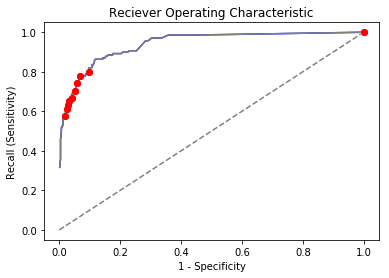

In [48]:
import numpy as np


def plot_ROC(*classified_sets):
    """plots the ROC curve of classified test data. Classified data is a list of triplets - object, real_class, probability"""
    
    
    def ROC_point(discrim, classified_set):
        counts = Counter((real_class, probability_in_class > discrim) 
                             for _, real_class, probability_in_class in classified_set)
        tn, tp, fn, fp = counts[(False,False)], counts[(True,True)], counts[(True,False)], counts[(False, True)]
        return 1-specificity(tp,fp,fn,tn), recall(tp,fp,fn,tn)
    
    line_cols = ["blue","grey","orange","green"]
    
    _, ax = plt.subplots()
    ax.set(ylabel = "Recall (Sensitivity)", xlabel = "1 - Specificity", title = "Reciever Operating Characteristic")
    
    set_and_col = zip(classified_sets,line_cols)
    for c_set, col in set_and_col:
        xs=[]
        ys=[]

        mkr_xs = []
        mkr_ys = []

        for discrim in np.arange(0,1,0.001):
            x, y = ROC_point(discrim,c_set)
            xs.append(x)
            ys.append(y)

        for discrim in np.arange(0,1,0.1):
            x, y = ROC_point(discrim,c_set)
            mkr_xs.append(x)
            mkr_ys.append(y)

        ax.plot(xs,ys, color=col)
        ax.plot(mkr_xs,mkr_ys,"ro")
        
    ax.plot(np.arange(0,1,0.01), np.arange(0,1,0.01),"--", color="grey")
    plt.show()
    
plot_ROC(classified,classified1) 

            
    

Let's look at the characteristics of some of the words we are investigating. What words indicate spamminess most strongly? What words are safest? 


In [80]:
word_spam_probs = [[word, spam_rate/(spam_rate + non_spam_rate)] for word, spam_rate, non_spam_rate in Jim.word_probs]

word_spam_probs.sort(key = lambda row: row[1])

for word in word_spam_probs:
    print word

['spambayes', 0.031005550902199065]
['users', 0.032699995508242374]
['was', 0.038115848444126424]
['razor', 0.03860771800809631]
['zzzzteana', 0.043052297502414794]
['sadev', 0.04945764170384293]
['apt', 0.05699522430126047]
['ouch', 0.059252828345858544]
['bliss', 0.06724344961359648]
['selling', 0.06724344961359648]
['perl', 0.0687895681753756]
['wedded', 0.0687895681753756]
['spamassassin', 0.07040845933137753]
['java', 0.07210538479315923]
['problem', 0.07575705019251448]
['bug', 0.07575705019251448]
['satalk', 0.0770578757335905]
['kiddies', 0.08198505949923046]
['alsa', 0.08673894912427021]
['test', 0.09811761534660138]
['cvs', 0.09811761534660138]
['window', 0.10144456314738261]
['sed', 0.10144456314738261]
['09', 0.10500504831963076]
['headlines', 0.10500504831963076]
['goodbye', 0.11293241636072186]
['global', 0.11293241636072186]
['cnet', 0.11736256650008062]
['exmh', 0.11736256650008062]
['roman', 0.11736256650008062]
['united', 0.11736256650008062]
['warming', 0.11736256650

["friend's", 0.6660567246111619]
['marching', 0.6660567246111619]
['aug', 0.6660567246111619]
['palladium', 0.6660567246111619]
['346', 0.6660567246111619]
['updated', 0.6660567246111619]
['amorous', 0.6660567246111619]
['shoot', 0.6660567246111619]
['politician', 0.6660567246111619]
['voip', 0.6660567246111619]
['phonebook', 0.6660567246111619]
['heading', 0.6660567246111619]
['tired', 0.6660567246111619]
['materialisation', 0.6660567246111619]
['tectonics', 0.6660567246111619]
["'perl", 0.6660567246111619]
['chef', 0.6660567246111619]
['second', 0.6660567246111619]
['street', 0.6660567246111619]
['n', 0.6660567246111619]
['thunder', 0.6660567246111619]
['fud', 0.6660567246111619]
['liberty', 0.6660567246111619]
['lights', 0.6660567246111619]
['reconstruction', 0.6660567246111619]
['widget', 0.6660567246111619]
['sinks', 0.6660567246111619]
['astrophysicists', 0.6660567246111619]
['cyberslapps', 0.6660567246111619]
['met', 0.6660567246111619]
['china', 0.6660567246111619]
['codecs', 0

['less', 0.7821415781305956]
['hand', 0.7821415781305956]
['piece', 0.7821415781305956]
['details', 0.7821415781305956]
['please', 0.7874199184624344]
['low', 0.8021126637401843]
['time', 0.8036912276728847]
['publishing', 0.8103896103896104]
['summer', 0.8103896103896104]
['27', 0.8103896103896104]
['virus', 0.8103896103896104]
['see', 0.8103896103896104]
['pc', 0.8103896103896104]
['win', 0.8103896103896104]
['scoop', 0.8103896103896104]
['online', 0.8206491892360609]
['trial', 0.8231303505088031]
['org', 0.8231303505088031]
['custom', 0.8231303505088031]
['get', 0.8280616289623953]
['own', 0.8303831692788645]
['4', 0.8383382053326247]
['5', 0.8383382053326247]
['30', 0.8383382053326247]
['one', 0.8407545232901321]
['life', 0.8426117150443684]
['save', 0.8568065908199293]
['market', 0.8568065908199293]
['9', 0.8568065908199293]
['we', 0.8568065908199293]
['now', 0.8568065908199293]
['everybody', 0.8568065908199294]
['charge', 0.8568065908199294]
['must', 0.8568065908199294]
['woman',